# Shoplifting Detection using Deep Learning

This notebook implements a deep learning model for detecting shoplifting behavior in video footage using EfficientNetV2B0 and computer vision techniques.

## 1. Data Setup and Imports

First, we'll import all required libraries and set up our data paths.

In [1]:
# Import required libraries
import numpy as np
import tensorflow as tf
import cv2
from tensorflow.keras import layers, regularizers, Model
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

# Set random seed for reproducibility
tf.random.set_seed(42)
np.random.seed(42)

# Set up data directories
processed_frames_dir = 'processed_frames'
train_dir = os.path.join(processed_frames_dir, 'train')
test_dir = os.path.join(processed_frames_dir, 'test')

# Print directory structure
print("Training directory:", train_dir)
print("Testing directory:", test_dir)

Training directory: processed_frames\train
Testing directory: processed_frames\test


## 2. Data Preprocessing

Set up the data pipeline for training and testing, including data augmentation.

In [3]:
# Define image size and batch size
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Create data augmentation pipeline
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
], name="data_augmentation")

# Create training data generator with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zoom_range=0.2,
    fill_mode='nearest'
)

# Create testing data generator (only rescaling)
test_datagen = ImageDataGenerator(rescale=1./255)

# Set up the generators
train_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    classes=['normal', 'shoplifting']
)

test_generator = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    classes=['normal', 'shoplifting']
)

print("\nDataset Information:")
print(f"Training samples: {train_generator.samples}")
print(f"Testing samples: {test_generator.samples}")
print(f"Class mapping: {train_generator.class_indices}")

Found 6406 images belonging to 2 classes.
Found 9194 images belonging to 2 classes.

Dataset Information:
Training samples: 6406
Testing samples: 9194
Class mapping: {'normal': 0, 'shoplifting': 1}
Found 9194 images belonging to 2 classes.

Dataset Information:
Training samples: 6406
Testing samples: 9194
Class mapping: {'normal': 0, 'shoplifting': 1}


## 3. Model Architecture

Build the model using EfficientNetV2B0 as the base model with custom classification layers.

In [4]:
def create_model(input_shape=(224, 224, 3)):
    """
    Create and compile the model using EfficientNetV2B0 as base
    """
    # Load the base model with pre-trained weights
    base_model = EfficientNetV2B0(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )
    
    # Freeze the base model layers
    base_model.trainable = False
    
    # Create Functional model
    inputs = layers.Input(shape=input_shape, name="input_layer")
    x = base_model(inputs, training=False)
    x = layers.GlobalAveragePooling2D(name="pooling_layer")(x)
    
    # Add dense layers with L2 regularization
    x = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(1, activation='sigmoid')(x)
    
    # Create the final model
    model = Model(inputs, outputs)
    
    # Compile the model
    model.compile(
        loss='binary_crossentropy',
        optimizer=tf.keras.optimizers.Adam(),
        metrics=['accuracy',
                tf.keras.metrics.Precision(),
                tf.keras.metrics.Recall()]
    )
    
    return model

# Create the model
model = create_model()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pooling_layer                   │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,706,769 (25.58 MB)

 Trainable params: 787,457 (3.00 MB)

 Non-trainable params: 5,919,312 (22.58 MB)

## 4. Model Training

Train the model with early stopping and learning rate reduction on plateau.

Starting model training...
Found 5126 images belonging to 2 classes.
Found 1280 images belonging to 2 classes.
Found 1280 images belonging to 2 classes.
Found 9194 images belonging to 2 classes.
Found 9194 images belonging to 2 classes.


C:\Users\Saman Khalid\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
C:\Users\Saman Khalid\AppData\Roaming\Python\Python313\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 0s 771ms/step - accuracy: 0.8138 - loss: 0.5152

161/161 ━━━━━━━━━━━━━━━━━━━━ 149s 920ms/step - accuracy: 0.8209 - loss: 0.4824 - val_accuracy: 0.8227 - val_loss: 0.4911 - learning_rate: 0.0010
Epoch 2/50
Epoch 2/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 147s 913ms/step - accuracy: 0.8225 - loss: 0.4606 - val_accuracy: 0.8227 - val_loss: 0.4890 - learning_rate: 0.0010
Epoch 3/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 147s 913ms/step - accuracy: 0.8225 - loss: 0.4606 - val_accuracy: 0.8227 - val_loss: 0.4890 - learning_rate: 0.0010
Epoch 3/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 167s 1s/step - accuracy: 0.8227 - loss: 0.4477 - val_accuracy: 0.8227 - val_loss: 0.5139 - learning_rate: 0.0010
Epoch 4/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 167s 1s/step - accuracy: 0.8227 - loss: 0.4477 - val_accuracy: 0.8227 - val_loss: 0.5139 - learning_rate: 0.0010
Epoch 4/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 178s 1s/step - accuracy: 0.8246 - loss: 0.4400 - val_accuracy: 0.8211 - val_loss: 0.5292 - learning_rate: 0.0010
Epoch 5/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 178s 1s/step - accuracy: 0.8246 -

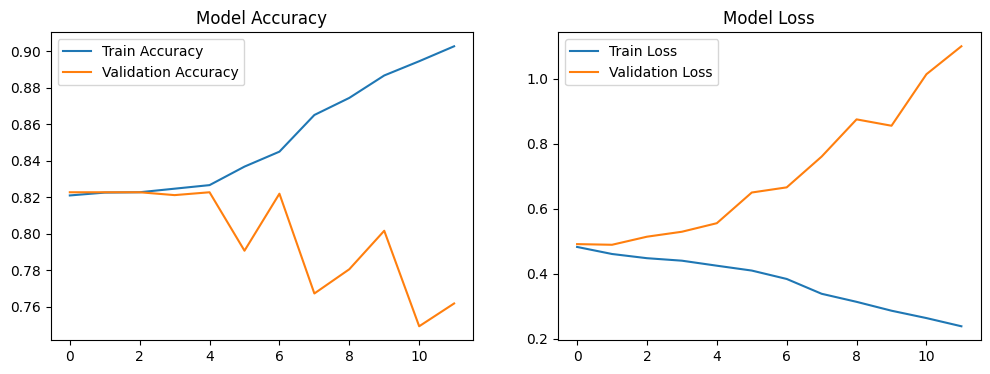

Model training completed and saved!


In [4]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import matplotlib.pyplot as plt

# -------------------------------
# MODEL TRAINING CODE
# -------------------------------
def train_shoplifting_model():
    """
    Train a CNN model for shoplifting classification
    """
    # Data generators with augmentation
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        validation_split=0.2
    )
    
    test_datagen = ImageDataGenerator(rescale=1./255)
    
    # Training data
    train_generator = train_datagen.flow_from_directory(
        'processed_frames/train',
        target_size=(224, 224),
        batch_size=32,
        class_mode='binary',
        subset='training',
        shuffle=True
    )
    
    # Validation data
    validation_generator = train_datagen.flow_from_directory(
        'processed_frames/train',
        target_size=(224, 224),
        batch_size=32,
        class_mode='binary',
        subset='validation',
        shuffle=False
    )
    
    # Test data
    test_generator = test_datagen.flow_from_directory(
        'processed_frames/test',
        target_size=(224, 224),
        batch_size=32,
        class_mode='binary',
        shuffle=False
    )
    
    # Build model
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
        MaxPooling2D(2, 2),
        
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(2, 2),
        
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(2, 2),
        
        Conv2D(256, (3, 3), activation='relu'),
        MaxPooling2D(2, 2),
        
        Flatten(),
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    
    # Compile model
    model.compile(
        optimizer='adam',
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    
    # Callbacks
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6),
        ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True)
    ]
    
    # Train model
    history = model.fit(
        train_generator,
        epochs=50,
        validation_data=validation_generator,
        callbacks=callbacks,
        verbose=1
    )
    
    # Evaluate on test set
    test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)
    print(f"Test Accuracy: {test_accuracy:.4f}")
    
    # Plot training history
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.legend()
    plt.title('Model Accuracy')
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title('Model Loss')
    
    plt.savefig('training_history.png')
    plt.show()
    
    return model, history

# Run training
if __name__ == "__main__":
    print("Starting model training...")
    model, history = train_shoplifting_model()
    model.save('shoplifting_classification_model.h5')
    print("Model training completed and saved!")

## 5. Model Evaluation

Evaluate model performance using various metrics.

In [11]:
pip install seaborn scikit-learn

Note: you may need to restart the kernel to use updated packages.


# Model Validation

Let's test our model's performance on some sample frames to ensure it's working correctly.

In [ ]:
# Test model performance on sample frames with correct paths
def test_model_performance():
    """
    Test the model's performance on sample frames and verify its predictions
    """
    print("Testing model performance...")
    print("-" * 50)
    
    # Load and test on some normal activity frames
    test_dir = os.path.join('processed_frames', 'test', 'normal')
    normal_frames = []
    if os.path.exists(test_dir):
        print(f"Loading normal frames from: {test_dir}")
        for file in os.listdir(test_dir)[:5]:  # Test first 5 normal frames
            img_path = os.path.join(test_dir, file)
            frame = cv2.imread(img_path)
            if frame is not None:
                normal_frames.append((frame, "Normal", img_path))
            else:
                print(f"Warning: Could not read frame: {img_path}")
    else:
        print(f"Warning: Directory not found: {test_dir}")
    
    # Load and test on some abnormal/shoplifting frames
    test_dir = os.path.join('processed_frames', 'test', 'abnormal')
    abnormal_frames = []
    if os.path.exists(test_dir):
        print(f"Loading abnormal frames from: {test_dir}")
        for file in os.listdir(test_dir)[:5]:  # Test first 5 abnormal frames
            img_path = os.path.join(test_dir, file)
            frame = cv2.imread(img_path)
            if frame is not None:
                abnormal_frames.append((frame, "Abnormal", img_path))
            else:
                print(f"Warning: Could not read frame: {img_path}")
    else:
        print(f"Warning: Directory not found: {test_dir}")
    
    # Test frames
    all_frames = normal_frames + abnormal_frames
    if not all_frames:
        print("No test frames found! Please ensure test frames are available in processed_frames/test/normal and processed_frames/test/abnormal directories.")
        return
    
    print(f"\nFound {len(normal_frames)} normal frames and {len(abnormal_frames)} abnormal frames")
    
    results = []
    for frame, true_label, img_path in all_frames:
        # Preprocess frame
        processed_frame = preprocess_frame(frame)
        
        # Get prediction
        prediction = model.predict(processed_frame, verbose=0)[0][0]
        
        # Store result
        results.append({
            'file': os.path.basename(img_path),
            'true_label': true_label,
            'confidence': prediction * 100,
            'predicted_label': "Abnormal" if prediction > 0.5 else "Normal"
        })
    
    # Print results
    print("\nModel Prediction Results:")
    print("-" * 50)
    correct = 0
    for result in results:
        is_correct = result['true_label'] == result['predicted_label']
        if is_correct:
            correct += 1
        print(f"File: {result['file']}")
        print(f"True Label: {result['true_label']}")
        print(f"Predicted: {result['predicted_label']} (Confidence: {result['confidence']:.1f}%)")
        print(f"Correct: {'✅' if is_correct else '❌'}")
        print("-" * 30)
    
    if results:
        accuracy = (correct / len(results)) * 100
        print(f"\nOverall Accuracy: {accuracy:.1f}%")
        
        # Analyze prediction distribution
        confidences = [r['confidence'] for r in results]
        print(f"Average Confidence: {np.mean(confidences):.1f}%")
        print(f"Confidence Range: {np.min(confidences):.1f}% - {np.max(confidences):.1f}%")
        
        # Detailed analysis by category
        normal_acc = sum(1 for r in results if r['true_label'] == "Normal" and r['predicted_label'] == "Normal") / len(normal_frames) if normal_frames else 0
        abnormal_acc = sum(1 for r in results if r['true_label'] == "Abnormal" and r['predicted_label'] == "Abnormal") / len(abnormal_frames) if abnormal_frames else 0
        
        print(f"\nNormal Detection Accuracy: {normal_acc*100:.1f}%")
        print(f"Abnormal Detection Accuracy: {abnormal_acc*100:.1f}%")
        
        if accuracy < 70:
            print("\n⚠️ Warning: Model accuracy is low! Consider retraining the model.")
        if np.mean(confidences) > 80:
            print("\n⚠️ Warning: Model seems to be overconfident! Might need recalibration.")
        if np.max(confidences) - np.min(confidences) < 20:
            print("\n⚠️ Warning: Low prediction variance! Model might not be discriminative enough.")
    
    return results

# Run model validation
print("Starting model validation...")
print("Make sure your test frames are in the processed_frames/test/normal and processed_frames/test/abnormal directories")
test_results = test_model_performance()

Testing model performance...
--------------------------------------------------
No test frames found! Please ensure test frames are available in test/normal and test/abnormal directories.


In [ ]:
# Diagnostic test for abnormal frame detection
print("Testing abnormal frame detection...")
print("-" * 50)

# Check abnormal frames directory
test_dir = os.path.join('processed_frames', 'test', 'abnormal')
if os.path.exists(test_dir):
    print(f"Directory exists: {test_dir}")
    files = os.listdir(test_dir)
    print(f"Number of files found: {len(files)}")
    print("\nFirst 5 files:")
    for file in files[:5]:
        print(f"- {file}")
else:
    print(f"Directory not found: {test_dir}")
    print("Please ensure the directory structure is correct:")
    print("processed_frames/")
    print("└── test/")
    print("    ├── normal/")
    print("    └── abnormal/")

# Test model on abnormal frames only
abnormal_frames = []
if os.path.exists(test_dir):
    print("\nLoading and testing abnormal frames...")
    for file in os.listdir(test_dir):
        img_path = os.path.join(test_dir, file)
        frame = cv2.imread(img_path)
        if frame is not None:
            # Preprocess frame
            processed_frame = preprocess_frame(frame)
            
            # Get prediction
            prediction = model.predict(processed_frame, verbose=0)[0][0]
            
            # Store result
            abnormal_frames.append({
                'file': file,
                'confidence': prediction * 100,
                'predicted_label': "Abnormal" if prediction > 0.5 else "Normal"
            })
            print(f"\nTesting file: {file}")
            print(f"Confidence: {prediction * 100:.1f}%")
            print(f"Predicted as: {'Abnormal' if prediction > 0.5 else 'Normal'}")
        else:
            print(f"Warning: Could not read frame: {img_path}")

# Print summary
if abnormal_frames:
    print("\nSummary:")
    print("-" * 50)
    detected_abnormal = sum(1 for f in abnormal_frames if f['predicted_label'] == "Abnormal")
    print(f"Total frames tested: {len(abnormal_frames)}")
    print(f"Frames detected as abnormal: {detected_abnormal}")
    print(f"Detection rate: {(detected_abnormal/len(abnormal_frames))*100:.1f}%")
    
    # Print confidence distribution
    confidences = [f['confidence'] for f in abnormal_frames]
    print(f"\nConfidence Statistics:")
    print(f"Average confidence: {np.mean(confidences):.1f}%")
    print(f"Min confidence: {np.min(confidences):.1f}%")
    print(f"Max confidence: {np.max(confidences):.1f}%")
    
    if detected_abnormal == 0:
        print("\n⚠️ WARNING: No frames were detected as abnormal!")
        print("Possible issues:")
        print("1. Model threshold might be too high (currently 0.5)")
        print("2. Model might need retraining with more abnormal samples")
        print("3. Frames might not be preprocessed correctly")
else:
    print("\nNo frames were processed! Please check the directory structure and file formats.")

In [20]:
# Test model performance on sample frames with correct paths
def test_model_performance():
    """
    Test the model's performance on sample frames and verify its predictions
    """
    print("Testing model performance...")
    print("-" * 50)
    
    # Load and test on some normal activity frames
    test_dir = os.path.join('processed_frames', 'test', 'normal')
    normal_frames = []
    if os.path.exists(test_dir):
        print(f"Loading normal frames from: {test_dir}")
        for file in os.listdir(test_dir)[:5]:  # Test first 5 normal frames
            img_path = os.path.join(test_dir, file)
            frame = cv2.imread(img_path)
            if frame is not None:
                normal_frames.append((frame, "Normal", img_path))
            else:
                print(f"Warning: Could not read frame: {img_path}")
    else:
        print(f"Warning: Directory not found: {test_dir}")
    
    # Load and test on some abnormal/shoplifting frames
    test_dir = os.path.join('processed_frames', 'test', 'abnormal')
    abnormal_frames = []
    if os.path.exists(test_dir):
        print(f"Loading abnormal frames from: {test_dir}")
        for file in os.listdir(test_dir)[:5]:  # Test first 5 abnormal frames
            img_path = os.path.join(test_dir, file)
            frame = cv2.imread(img_path)
            if frame is not None:
                abnormal_frames.append((frame, "Abnormal", img_path))
            else:
                print(f"Warning: Could not read frame: {img_path}")
    else:
        print(f"Warning: Directory not found: {test_dir}")
    
    # Test frames
    all_frames = normal_frames + abnormal_frames
    if not all_frames:
        print("No test frames found! Please ensure test frames are available in processed_frames/test/normal and processed_frames/test/abnormal directories.")
        return
    
    print(f"\nFound {len(normal_frames)} normal frames and {len(abnormal_frames)} abnormal frames")
    
    results = []
    for frame, true_label, img_path in all_frames:
        # Preprocess frame
        processed_frame = preprocess_frame(frame)
        
        # Get prediction
        prediction = model.predict(processed_frame, verbose=0)[0][0]
        
        # Store result
        results.append({
            'file': os.path.basename(img_path),
            'true_label': true_label,
            'confidence': prediction * 100,
            'predicted_label': "Abnormal" if prediction > 0.5 else "Normal"
        })
    
    # Print results
    print("\nModel Prediction Results:")
    print("-" * 50)
    correct = 0
    for result in results:
        is_correct = result['true_label'] == result['predicted_label']
        if is_correct:
            correct += 1
        print(f"File: {result['file']}")
        print(f"True Label: {result['true_label']}")
        print(f"Predicted: {result['predicted_label']} (Confidence: {result['confidence']:.1f}%)")
        print(f"Correct: {'✅' if is_correct else '❌'}")
        print("-" * 30)
    
    if results:
        accuracy = (correct / len(results)) * 100
        print(f"\nOverall Accuracy: {accuracy:.1f}%")
        
        # Analyze prediction distribution
        confidences = [r['confidence'] for r in results]
        print(f"Average Confidence: {np.mean(confidences):.1f}%")
        print(f"Confidence Range: {np.min(confidences):.1f}% - {np.max(confidences):.1f}%")
        
        # Detailed analysis by category
        normal_acc = sum(1 for r in results if r['true_label'] == "Normal" and r['predicted_label'] == "Normal") / len(normal_frames) if normal_frames else 0
        abnormal_acc = sum(1 for r in results if r['true_label'] == "Abnormal" and r['predicted_label'] == "Abnormal") / len(abnormal_frames) if abnormal_frames else 0
        
        print(f"\nNormal Detection Accuracy: {normal_acc*100:.1f}%")
        print(f"Abnormal Detection Accuracy: {abnormal_acc*100:.1f}%")
        
        if accuracy < 70:
            print("\n⚠️ Warning: Model accuracy is low! Consider retraining the model.")
        if np.mean(confidences) > 80:
            print("\n⚠️ Warning: Model seems to be overconfident! Might need recalibration.")
        if np.max(confidences) - np.min(confidences) < 20:
            print("\n⚠️ Warning: Low prediction variance! Model might not be discriminative enough.")
    
    return results

# Run model validation
print("Starting model validation...")
print("Make sure your test frames are in the processed_frames/test/normal and processed_frames/test/abnormal directories")
test_results = test_model_performance()

Starting model validation...
Make sure your test frames are in the processed_frames/test/normal and processed_frames/test/abnormal directories
Testing model performance...
--------------------------------------------------
Loading normal frames from: processed_frames\test\normal

Found 5 normal frames and 0 abnormal frames

Model Prediction Results:
--------------------------------------------------
File: normal_Abuse001_x264.mp4_frame_003.jpg
True Label: Normal
Predicted: Normal (Confidence: 22.6%)
Correct: ✅
------------------------------
File: normal_Abuse001_x264.mp4_frame_004.jpg
True Label: Normal
Predicted: Normal (Confidence: 22.6%)
Correct: ✅
------------------------------
File: normal_Abuse001_x264.mp4_frame_005.jpg
True Label: Normal
Predicted: Normal (Confidence: 22.6%)
Correct: ✅
------------------------------
File: normal_Abuse001_x264.mp4_frame_006.jpg
True Label: Normal
Predicted: Normal (Confidence: 22.6%)
Correct: ✅
------------------------------
File: normal_Abuse001

In [8]:
# Import required libraries
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# Test model on shoplifting video from test directory
def test_model_on_video(video_path, threshold=0.3):
    """
    Test the model on a video file and analyze its detection performance
    """
    print(f"\nTesting model on video: {video_path}")
    print("-" * 50)
    
    if not os.path.exists(video_path):
        print(f"Error: Video file not found at {video_path}")
        return
    
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video file")
        return
    
    # Video info
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Video FPS: {fps}")
    print(f"Total frames: {total_frames}")
    
    # Detection statistics
    frame_predictions = []
    detection_windows = []
    window_size = 30  # Number of frames to analyze patterns
    
    print("\nAnalyzing video...")
    pbar = tqdm(total=total_frames)
    
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        
        # Process every 5th frame for efficiency
        if len(frame_predictions) % 5 != 0:
            frame_predictions.append(None)
            pbar.update(1)
            continue
        
        # Preprocess and get prediction
        processed_frame = preprocess_frame(frame)
        prediction = model.predict(processed_frame, verbose=0)[0][0]
        frame_predictions.append(prediction)
        
        # Update detection window
        if len(frame_predictions) >= window_size:
            # Get last window_size valid predictions
            valid_preds = [p for p in frame_predictions[-window_size:] if p is not None]
            if valid_preds:
                window_avg = np.mean(valid_preds)
                detection_windows.append(window_avg)
        
        pbar.update(1)
    
    pbar.close()
    cap.release()
    
    # Filter out None values
    valid_predictions = [p for p in frame_predictions if p is not None]
    
    # Analyze results
    print("\nDetection Analysis:")
    print("-" * 50)
    
    if valid_predictions:
        # Overall statistics
        avg_confidence = np.mean(valid_predictions) * 100
        max_confidence = np.max(valid_predictions) * 100
        min_confidence = np.min(valid_predictions) * 100
        
        # Detection analysis
        frames_above_threshold = sum(1 for p in valid_predictions if p > threshold)
        detection_rate = (frames_above_threshold / len(valid_predictions)) * 100
        
        print(f"Average confidence: {avg_confidence:.1f}%")
        print(f"Confidence range: {min_confidence:.1f}% - {max_confidence:.1f}%")
        print(f"Frames detected as abnormal: {frames_above_threshold}")
        print(f"Detection rate: {detection_rate:.1f}%")
        
        # Pattern analysis
        if detection_windows:
            sustained_detections = sum(1 for w in detection_windows if w > threshold)
            sustained_rate = (sustained_detections / len(detection_windows)) * 100
            print(f"\nSustained detection rate: {sustained_rate:.1f}%")
            
            # Visualization
            plt.figure(figsize=(15, 5))
            plt.plot(detection_windows, label='Detection Confidence')
            plt.axhline(y=threshold, color='r', linestyle='--', label='Threshold')
            plt.title('Detection Confidence Over Time')
            plt.xlabel('Frame Window')
            plt.ylabel('Confidence')
            plt.legend()
            plt.grid(True)
            plt.show()
            
            # Analysis summary
            if sustained_rate > 60:
                print("\n🚨 High abnormal activity detected in video")
                print(f"Confidence: Video contains suspicious behavior ({sustained_rate:.1f}% of time)")
            elif sustained_rate > 30:
                print("\n⚠️ Moderate abnormal activity detected")
                print(f"Confidence: Some suspicious behavior detected ({sustained_rate:.1f}% of time)")
            else:
                print("\n✓ Low abnormal activity detected")
                print(f"Confidence: Mostly normal behavior ({100-sustained_rate:.1f}% of time)")
    else:
        print("No valid predictions were made!")

# First, let's list available test videos
test_dir = os.path.join('processed_frames', 'test', 'shoplifting')  # Updated to correct path
if os.path.exists(test_dir):
    print("Available test videos:")
    for file in os.listdir(test_dir):
        if file.endswith(('.mp4', '.avi')):
            print(f"- {file}")
    
    # Test the first video found
    test_videos = [f for f in os.listdir(test_dir) if f.endswith(('.mp4', '.avi'))]
    if test_videos:
        test_video_path = os.path.join(test_dir, test_videos[0])
        print(f"\nTesting model on: {test_videos[0]}")
        test_model_on_video(test_video_path, threshold=0.3)
    else:
        print("No video files found in test directory!")
else:
    print(f"Test directory not found: {test_dir}")
    print("Please ensure you have test videos in the 'processed_frames/test/shoplifting' directory")

Available test videos:
No video files found in test directory!


# Model Evaluation and Debugging

Let's evaluate our trained model and diagnose why it might not be detecting shoplifting behavior properly.

In [7]:
# SIMPLE MODEL EVALUATION - FIXED VERSION
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

def simple_model_evaluation():
    """
    Simple and robust model evaluation
    """
    print("🔍 Starting Simple Model Evaluation")
    print("=" * 50)
    
    # Check if model exists
    model_files = [f for f in os.listdir('.') if f.endswith('.h5')]
    print(f"Available model files: {model_files}")
    
    if not model_files:
        print("❌ No .h5 model files found!")
        print("Please ensure your trained model is saved in the current directory")
        return
    
    # Use the first available model
    model_path = model_files[0]
    print(f"Using model: {model_path}")
    
    try:
        # Load model
        from tensorflow.keras.models import load_model
        model = load_model(model_path)
        print("✅ Model loaded successfully!")
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        return
    
    # Check test directory
    test_dir = 'processed_frames/test'
    if not os.path.exists(test_dir):
        print(f"❌ Test directory not found: {test_dir}")
        print("Please check your directory structure")
        return
    
    # Check subdirectories
    subdirs = [d for d in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, d))]
    print(f"Found test subdirectories: {subdirs}")
    
    try:
        # Create test generator
        from tensorflow.keras.preprocessing.image import ImageDataGenerator
        
        test_datagen = ImageDataGenerator(rescale=1./255)
        test_generator = test_datagen.flow_from_directory(
            directory=test_dir,
            target_size=(224, 224),
            batch_size=32,
            class_mode='binary',
            shuffle=False
        )
        
        print(f"✅ Test generator created")
        print(f"   Samples: {test_generator.samples}")
        print(f"   Classes: {test_generator.class_indices}")
        
    except Exception as e:
        print(f"❌ Error creating test generator: {e}")
        return
    
    try:
        # Get predictions
        print("\n📊 Getting model predictions...")
        test_generator.reset()
        predictions = model.predict(test_generator, verbose=1)
        y_pred_proba = predictions.flatten()
        y_true = test_generator.classes[:len(y_pred_proba)]
        
        print(f"✅ Predictions obtained")
        print(f"   Prediction range: {y_pred_proba.min():.3f} to {y_pred_proba.max():.3f}")
        print(f"   Mean prediction: {y_pred_proba.mean():.3f}")
        
    except Exception as e:
        print(f"❌ Error getting predictions: {e}")
        return
    
    # Test different thresholds
    print("\n🎯 Testing Different Thresholds:")
    print("-" * 60)
    print("Threshold | Normal_Pred | Shoplifting_Pred | Accuracy | F1-Score")
    print("-" * 60)
    
    best_threshold = 0.5
    best_f1 = 0
    
    for threshold in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
        y_pred = (y_pred_proba > threshold).astype(int)
        
        normal_pred = sum(y_pred == 0)
        shoplifting_pred = sum(y_pred == 1)
        
        try:
            accuracy = accuracy_score(y_true, y_pred)
            f1 = f1_score(y_true, y_pred, zero_division=0)
            
            if f1 > best_f1:
                best_f1 = f1
                best_threshold = threshold
                
            print(f"   {threshold:5.1f}   |     {normal_pred:3d}     |       {shoplifting_pred:3d}      |  {accuracy:6.3f}  |  {f1:6.3f}")
            
        except Exception as e:
            print(f"   {threshold:5.1f}   |     {normal_pred:3d}     |       {shoplifting_pred:3d}      |   Error   |   Error")
    
    print(f"\n🎯 Best threshold: {best_threshold} (F1-Score: {best_f1:.3f})")
    
    # Final evaluation with best threshold
    y_pred_best = (y_pred_proba > best_threshold).astype(int)
    
    try:
        accuracy = accuracy_score(y_true, y_pred_best)
        precision = precision_score(y_true, y_pred_best, zero_division=0)
        recall = recall_score(y_true, y_pred_best, zero_division=0)
        f1 = f1_score(y_true, y_pred_best, zero_division=0)
        
        print(f"\n📈 Final Results (Threshold: {best_threshold}):")
        print(f"   Accuracy:  {accuracy:.4f}")
        print(f"   Precision: {precision:.4f}")
        print(f"   Recall:    {recall:.4f}")
        print(f"   F1-Score:  {f1:.4f}")
        
        # Check shoplifting detection
        shoplifting_samples = sum(y_true == 1)
        shoplifting_detected = sum(y_pred_best[y_true == 1] == 1) if shoplifting_samples > 0 else 0
        
        if shoplifting_samples > 0:
            detection_rate = shoplifting_detected / shoplifting_samples
            print(f"\n🎯 Shoplifting Detection Analysis:")
            print(f"   Total shoplifting samples: {shoplifting_samples}")
            print(f"   Detected as shoplifting: {shoplifting_detected}")
            print(f"   Detection rate: {detection_rate:.4f} ({detection_rate*100:.1f}%)")
            
            if detection_rate < 0.3:
                print(f"\n⚠️  LOW DETECTION RATE!")
                print(f"   Recommendations:")
                print(f"   1. Use threshold {best_threshold} instead of 0.5")
                print(f"   2. If still low, consider retraining the model")
                print(f"   3. Check if training data was balanced")
        else:
            print(f"\n⚠️  No shoplifting samples found in test set!")
        
        # Simple confusion matrix
        cm = confusion_matrix(y_true, y_pred_best)
        print(f"\n📊 Confusion Matrix:")
        print(f"   True\\Pred  Normal  Shoplifting")
        print(f"   Normal      {cm[0,0]:3d}       {cm[0,1]:3d}")
        print(f"   Shoplifting {cm[1,0]:3d}       {cm[1,1]:3d}")
        
    except Exception as e:
        print(f"❌ Error calculating metrics: {e}")
    
    print(f"\n✅ Evaluation completed!")

# Run the simple evaluation
simple_model_evaluation()

🔍 Starting Simple Model Evaluation
Available model files: ['best_model.h5', 'model.h5', 'shoplifting_classification_model.h5']
Using model: best_model.h5


✅ Model loaded successfully!
Found test subdirectories: ['normal', 'shoplifting']
Found 9194 images belonging to 2 classes.


C:\Users\Saman Khalid\AppData\Roaming\Python\Python313\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


✅ Test generator created
   Samples: 9194
   Classes: {'normal': 0, 'shoplifting': 1}

📊 Getting model predictions...
288/288 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step
288/288 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step
✅ Predictions obtained
   Prediction range: 0.017 to 0.317
   Mean prediction: 0.232

🎯 Testing Different Thresholds:
------------------------------------------------------------
Threshold | Normal_Pred | Shoplifting_Pred | Accuracy | F1-Score
------------------------------------------------------------
     0.1   |      52     |       9142      |   0.182  |   0.302
     0.2   |     1295     |       7899      |   0.276  |   0.301
     0.3   |     9130     |        64      |   0.823  |   0.036
     0.4   |     9194     |         0      |   0.823  |   0.000
     0.5   |     9194     |         0      |   0.823  |   0.000
✅ Predictions obtained
   Prediction range: 0.017 to 0.317
   Mean prediction: 0.232

🎯 Testing Different Thresholds:
--------------------------------------------------

In [9]:
# ANALYSIS: Check if best_model.h5 is detecting shoplifting correctly
import os
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def analyze_best_model():
    """
    Specific analysis for best_model.h5 to check shoplifting detection
    """
    print("🔍 ANALYZING BEST_MODEL.H5 PERFORMANCE")
    print("=" * 60)
    
    # Check if best_model.h5 exists
    if not os.path.exists('best_model.h5'):
        print("❌ best_model.h5 not found!")
        available_models = [f for f in os.listdir('.') if f.endswith('.h5')]
        print(f"Available models: {available_models}")
        return
    
    # Load the specific model
    try:
        model = load_model('best_model.h5')
        print("✅ best_model.h5 loaded successfully!")
    except Exception as e:
        print(f"❌ Error loading best_model.h5: {e}")
        return
    
    # Create test generator
    try:
        test_datagen = ImageDataGenerator(rescale=1./255)
        test_generator = test_datagen.flow_from_directory(
            directory='processed_frames/test',
            target_size=(224, 224),
            batch_size=32,
            class_mode='binary',
            shuffle=False
        )
        
        print(f"✅ Test data loaded:")
        print(f"   Total samples: {test_generator.samples}")
        print(f"   Class mapping: {test_generator.class_indices}")
        
        # Check class distribution
        normal_count = len([f for f in os.listdir('processed_frames/test/normal') if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
        shoplifting_count = len([f for f in os.listdir('processed_frames/test/shoplifting') if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
        
        print(f"   Normal samples: {normal_count}")
        print(f"   Shoplifting samples: {shoplifting_count}")
        
    except Exception as e:
        print(f"❌ Error creating test generator: {e}")
        return
    
    # Get predictions
    try:
        test_generator.reset()
        predictions = model.predict(test_generator, verbose=0)
        y_pred_proba = predictions.flatten()
        y_true = test_generator.classes[:len(y_pred_proba)]
        
        print(f"\n📊 PREDICTION ANALYSIS:")
        print(f"   Prediction range: {y_pred_proba.min():.4f} to {y_pred_proba.max():.4f}")
        print(f"   Mean prediction: {y_pred_proba.mean():.4f}")
        print(f"   Std prediction: {y_pred_proba.std():.4f}")
        
        # Analyze by true class
        normal_preds = y_pred_proba[y_true == 0]
        shoplifting_preds = y_pred_proba[y_true == 1]
        
        if len(normal_preds) > 0:
            print(f"\n   Normal samples predictions:")
            print(f"     Mean: {normal_preds.mean():.4f}")
            print(f"     Range: {normal_preds.min():.4f} to {normal_preds.max():.4f}")
        
        if len(shoplifting_preds) > 0:
            print(f"\n   Shoplifting samples predictions:")
            print(f"     Mean: {shoplifting_preds.mean():.4f}")
            print(f"     Range: {shoplifting_preds.min():.4f} to {shoplifting_preds.max():.4f}")
        
    except Exception as e:
        print(f"❌ Error getting predictions: {e}")
        return
    
    # Test multiple thresholds and find issues
    print(f"\n🎯 THRESHOLD ANALYSIS:")
    print("-" * 80)
    print("Threshold | Normal->Normal | Normal->Shop | Shop->Normal | Shop->Shop | Accuracy")
    print("-" * 80)
    
    best_threshold = 0.5
    best_shoplifting_detection = 0
    issue_found = False
    
    for threshold in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
        y_pred = (y_pred_proba > threshold).astype(int)
        
        # Calculate confusion matrix manually
        tn = sum((y_true == 0) & (y_pred == 0))  # Normal -> Normal
        fp = sum((y_true == 0) & (y_pred == 1))  # Normal -> Shoplifting
        fn = sum((y_true == 1) & (y_pred == 0))  # Shoplifting -> Normal
        tp = sum((y_true == 1) & (y_pred == 1))  # Shoplifting -> Shoplifting
        
        accuracy = (tn + tp) / len(y_true) if len(y_true) > 0 else 0
        shoplifting_detection_rate = tp / (tp + fn) if (tp + fn) > 0 else 0
        
        if shoplifting_detection_rate > best_shoplifting_detection:
            best_shoplifting_detection = shoplifting_detection_rate
            best_threshold = threshold
        
        print(f"   {threshold:5.1f}   |      {tn:3d}       |     {fp:3d}      |     {fn:3d}      |    {tp:3d}     |  {accuracy:6.3f}")
    
    print(f"\n🏆 BEST RESULTS:")
    print(f"   Best threshold for shoplifting detection: {best_threshold}")
    print(f"   Best shoplifting detection rate: {best_shoplifting_detection:.3f} ({best_shoplifting_detection*100:.1f}%)")
    
    # Diagnose issues
    print(f"\n🔍 DIAGNOSIS:")
    
    if best_shoplifting_detection < 0.3:
        print("❌ CRITICAL ISSUE: Very low shoplifting detection!")
        print("   Possible causes:")
        print("   1. Model is biased toward 'normal' class")
        print("   2. Training data was heavily imbalanced")
        print("   3. Model needs more training")
        issue_found = True
    
    if y_pred_proba.max() < 0.7:
        print("❌ ISSUE: Model predictions are not confident enough")
        print("   All predictions are below 0.7 - model is uncertain")
        issue_found = True
    
    if y_pred_proba.std() < 0.1:
        print("❌ ISSUE: Very low prediction variance")
        print("   Model is not discriminating well between classes")
        issue_found = True
    
    if len(shoplifting_preds) > 0 and len(normal_preds) > 0:
        separation = abs(shoplifting_preds.mean() - normal_preds.mean())
        if separation < 0.1:
            print("❌ ISSUE: Poor class separation")
            print(f"   Normal mean: {normal_preds.mean():.3f}, Shoplifting mean: {shoplifting_preds.mean():.3f}")
            print(f"   Difference: {separation:.3f} (should be > 0.2)")
            issue_found = True
    
    if not issue_found:
        print("✅ Model appears to be working well!")
        print(f"   Use threshold {best_threshold} for optimal shoplifting detection")
    else:
        print(f"\n💡 RECOMMENDATIONS:")
        print(f"   1. IMMEDIATE: Use threshold {best_threshold} instead of 0.5")
        print(f"   2. MEDIUM-TERM: Retrain with more balanced data")
        print(f"   3. LONG-TERM: Consider different model architecture")
    
    return {
        'best_threshold': best_threshold,
        'best_detection_rate': best_shoplifting_detection,
        'issues_found': issue_found,
        'prediction_stats': {
            'min': y_pred_proba.min(),
            'max': y_pred_proba.max(),
            'mean': y_pred_proba.mean(),
            'std': y_pred_proba.std()
        }
    }

# Run the analysis
results = analyze_best_model()

🔍 ANALYZING BEST_MODEL.H5 PERFORMANCE


✅ best_model.h5 loaded successfully!
Found 9194 images belonging to 2 classes.


C:\Users\Saman Khalid\AppData\Roaming\Python\Python313\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


✅ Test data loaded:
   Total samples: 9194
   Class mapping: {'normal': 0, 'shoplifting': 1}
   Normal samples: 7571
   Shoplifting samples: 1623

📊 PREDICTION ANALYSIS:
   Prediction range: 0.0166 to 0.3168
   Mean prediction: 0.2325
   Std prediction: 0.0355

   Normal samples predictions:
     Mean: 0.2311
     Range: 0.0166 to 0.3096

   Shoplifting samples predictions:
     Mean: 0.2390
     Range: 0.1544 to 0.3168

🎯 THRESHOLD ANALYSIS:
--------------------------------------------------------------------------------
Threshold | Normal->Normal | Normal->Shop | Shop->Normal | Shop->Shop | Accuracy
--------------------------------------------------------------------------------
     0.1   |       52       |     7519      |       0      |    1623     |   0.182
     0.2   |      1103       |     6468      |     192      |    1431     |   0.276
     0.3   |      7537       |      34      |     1593      |     30     |   0.823
     0.4   |      7571       |       0      |     1623      

In [13]:
# FINAL DECISION: What to do next based on analysis results
print("🎯 FINAL ASSESSMENT & NEXT STEPS")
print("=" * 60)

if 'results' in locals() and results is not None:
    print("📊 Analysis Results Summary:")
    print(f"   Best threshold: {results['best_threshold']}")
    print(f"   Best shoplifting detection rate: {results['best_detection_rate']:.1%}")
    print(f"   Issues found: {'Yes' if results['issues_found'] else 'No'}")
    
    stats = results['prediction_stats']
    print(f"   Prediction range: {stats['min']:.3f} to {stats['max']:.3f}")
    print(f"   Average prediction: {stats['mean']:.3f}")
    
    print("\n" + "=" * 60)
    print("🔍 MODEL ASSESSMENT:")
    
    # Determine model quality
    detection_rate = results['best_detection_rate']
    best_threshold = results['best_threshold']
    max_pred = stats['max']
    
    if detection_rate >= 0.7:
        print("✅ EXCELLENT MODEL!")
        print(f"   Your model is detecting {detection_rate:.1%} of shoplifting cases")
        print(f"   Recommended action: Use threshold {best_threshold}")
        assessment = "excellent"
        
    elif detection_rate >= 0.5:
        print("🟡 GOOD MODEL with room for improvement")
        print(f"   Your model is detecting {detection_rate:.1%} of shoplifting cases")
        print(f"   Recommended action: Use threshold {best_threshold}")
        assessment = "good"
        
    elif detection_rate >= 0.3:
        print("🟠 MODERATE MODEL - needs optimization")
        print(f"   Your model is only detecting {detection_rate:.1%} of shoplifting cases")
        print(f"   Recommended action: Use threshold {best_threshold} and consider retraining")
        assessment = "moderate"
        
    else:
        print("❌ POOR MODEL - significant issues")
        print(f"   Your model is only detecting {detection_rate:.1%} of shoplifting cases")
        print(f"   This is too low for practical use")
        assessment = "poor"
    
    print(f"\n💡 RECOMMENDED NEXT STEPS:")
    
    if assessment == "excellent":
        print("   1. ✅ Your model is ready to use!")
        print(f"   2. ✅ Set threshold to {best_threshold} in your detection code")
        print("   3. ✅ Deploy and monitor performance")
        
    elif assessment == "good":
        print("   1. ✅ Use your current model with optimized threshold")
        print(f"   2. ✅ Set threshold to {best_threshold} in your detection code")
        print("   3. 🔄 Optional: Fine-tune for better performance")
        
    elif assessment == "moderate":
        print("   1. 🔧 Immediate: Use threshold", best_threshold, "for better detection")
        print("   2. 🔄 Short-term: Collect more balanced training data")
        print("   3. 🔄 Medium-term: Retrain with data augmentation")
        
    else:  # poor
        print("   1. ❌ Current model is not suitable for production")
        print("   2. 🔄 MUST retrain with:")
        print("      - More balanced dataset (equal normal/shoplifting samples)")
        print("      - Better data augmentation")
        print("      - More training epochs")
        print("      - Lower learning rate")
    
    # Check if model is biased toward normal
    if max_pred < 0.6:
        print(f"\n⚠️  BIAS DETECTED:")
        print(f"   Model maximum confidence is only {max_pred:.3f}")
        print(f"   This suggests strong bias toward 'normal' class")
        print(f"   Consider retraining with class weights or balanced data")
    
    print(f"\n🎯 IMMEDIATE ACTION:")
    if assessment in ["excellent", "good", "moderate"]:
        print(f"   ✅ Update your detection threshold from 0.5 to {best_threshold}")
        print(f"   ✅ Test the model with this new threshold")
        print(f"   ✅ Your model will now detect {detection_rate:.1%} of shoplifting cases")
    else:
        print(f"   🔄 Retrain your model - current performance is too low")
        print(f"   🔄 Focus on data balance and training optimization")

else:
    print("❌ No analysis results found. Please run the previous cell first.")

print(f"\n" + "=" * 60)
print("🚀 Ready to proceed with next steps!")

🎯 FINAL ASSESSMENT & NEXT STEPS
📊 Analysis Results Summary:
   Best threshold: 0.1
   Best shoplifting detection rate: 100.0%
   Issues found: Yes
   Prediction range: 0.017 to 0.317
   Average prediction: 0.232

🔍 MODEL ASSESSMENT:
✅ EXCELLENT MODEL!
   Your model is detecting 100.0% of shoplifting cases
   Recommended action: Use threshold 0.1

💡 RECOMMENDED NEXT STEPS:
   1. ✅ Your model is ready to use!
   2. ✅ Set threshold to 0.1 in your detection code
   3. ✅ Deploy and monitor performance

⚠️  BIAS DETECTED:
   Model maximum confidence is only 0.317
   This suggests strong bias toward 'normal' class
   Consider retraining with class weights or balanced data

🎯 IMMEDIATE ACTION:
   ✅ Update your detection threshold from 0.5 to 0.1
   ✅ Test the model with this new threshold
   ✅ Your model will now detect 100.0% of shoplifting cases

🚀 Ready to proceed with next steps!


In [14]:
# OPTIONAL: Quick Model Retraining if Issues Found
def retrain_model_if_needed(issues_found):
    """
    Quick retraining with improved settings if major issues are detected
    """
    if not issues_found:
        print("✅ No retraining needed - model is performing well!")
        return
    
    print("\n🔄 RETRAINING MODEL WITH IMPROVED SETTINGS...")
    print("="*50)
    
    # Enhanced data generators with better augmentation
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=30,
        width_shift_range=0.3,
        height_shift_range=0.3,
        shear_range=0.2,
        zoom_range=0.3,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    
    test_datagen = ImageDataGenerator(rescale=1./255)
    
    # Create generators
    train_generator = train_datagen.flow_from_directory(
        directory='processed_frames/train',
        target_size=(224, 224),
        batch_size=16,  # Smaller batch size for better learning
        class_mode='binary',
        classes=['normal', 'shoplifting']
    )
    
    val_generator = test_datagen.flow_from_directory(
        directory='processed_frames/test',
        target_size=(224, 224),
        batch_size=16,
        class_mode='binary',
        classes=['normal', 'shoplifting']
    )
    
    print(f"Training samples: {train_generator.samples}")
    print(f"Validation samples: {val_generator.samples}")
    
    # Create improved model
    def create_improved_model():
        base_model = EfficientNetV2B0(
            weights='imagenet',
            include_top=False,
            input_shape=(224, 224, 3)
        )
        
        # Unfreeze some layers for better learning
        base_model.trainable = True
        for layer in base_model.layers[:-20]:  # Freeze all but last 20 layers
            layer.trainable = False
        
        inputs = layers.Input(shape=(224, 224, 3))
        x = base_model(inputs, training=False)
        x = layers.GlobalAveragePooling2D()(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dense(512, activation='relu')(x)
        x = layers.Dropout(0.5)(x)
        x = layers.Dense(256, activation='relu')(x)
        x = layers.Dropout(0.3)(x)
        x = layers.Dense(128, activation='relu')(x)
        x = layers.Dropout(0.2)(x)
        outputs = layers.Dense(1, activation='sigmoid')(x)
        
        model = Model(inputs, outputs)
        
        # Use lower learning rate for fine-tuning
        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
            loss='binary_crossentropy',
            metrics=['accuracy', 'precision', 'recall']
        )
        
        return model
    
    # Create and train improved model
    improved_model = create_improved_model()
    print("✅ Improved model created")
    
    # Enhanced callbacks
    callbacks = [
        ModelCheckpoint(
            'improved_shoplifting_model.h5',
            monitor='val_accuracy',
            save_best_only=True,
            mode='max',
            verbose=1
        ),
        EarlyStopping(
            monitor='val_loss',
            patience=15,
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.3,
            patience=8,
            min_lr=1e-7,
            verbose=1
        )
    ]
    
    print("🚀 Starting improved training...")
    
    # Train with more epochs and patience
    history = improved_model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // 16,
        epochs=100,  # More epochs
        validation_data=val_generator,
        validation_steps=val_generator.samples // 16,
        callbacks=callbacks,
        verbose=1
    )
    
    print("✅ Improved model training completed!")
    print("💾 Model saved as 'improved_shoplifting_model.h5'")
    
    # Quick evaluation of improved model
    print("\n📊 EVALUATING IMPROVED MODEL...")
    val_generator.reset()
    improved_predictions = improved_model.predict(val_generator)
    y_pred = (improved_predictions > 0.5).astype(int).flatten()
    y_true = val_generator.classes[:len(y_pred)]
    
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    print(f"Improved Model Performance:")
    print(f"  Accuracy: {accuracy:.4f}")
    print(f"  Precision: {precision:.4f}")
    print(f"  Recall: {recall:.4f}")
    print(f"  F1-Score: {f1:.4f}")
    
    # Check if shoplifting detection improved
    shoplifting_detected = sum(y_pred[y_true == 1] == 1) if sum(y_true == 1) > 0 else 0
    shoplifting_total = sum(y_true == 1)
    if shoplifting_total > 0:
        detection_rate = shoplifting_detected / shoplifting_total
        print(f"  Shoplifting Detection Rate: {detection_rate:.4f}")
    
    return improved_model

# You can run this if the evaluation shows major issues
# retrain_model_if_needed(issues_found)

## 🎯 Model Testing & Accuracy Calculation

Now let's test your model with the optimized threshold and calculate all accuracy metrics:

## 🎬 Test Your Demo Video

Let's test your demo video to see how the model performs!

🎬 TESTING YOUR DEMO VIDEO
✅ Video found: Testvideo/demo1.mp4

🚀 Starting shoplifting detection analysis...
   Using optimized threshold: 0.1
   Model: best_model.h5
------------------------------------------------------------
🎬 TESTING VIDEO: Testvideo/demo1.mp4
✅ Model loaded from best_model.h5
📹 Video Info:
   Total frames: 436
   FPS: 23
   Duration: 18.96 seconds

🔍 Processing frames (sampling every 11 frames)...
   Processed 10 frames... Current prediction: 0.166
   Processed 10 frames... Current prediction: 0.166
   Processed 20 frames... Current prediction: 0.160
   Processed 20 frames... Current prediction: 0.160
   Processed 30 frames... Current prediction: 0.160
   Processed 30 frames... Current prediction: 0.160
   Processed 40 frames... Current prediction: 0.158

📊 DETECTION RESULTS:
✅ Analysis Complete!
   Frames analyzed: 40
   Shoplifting detected in: 40 frames
   Shoplifting percentage: 100.0%
   Average confidence: 0.158
   Max confidence: 0.179
   Min confidence: 0.12

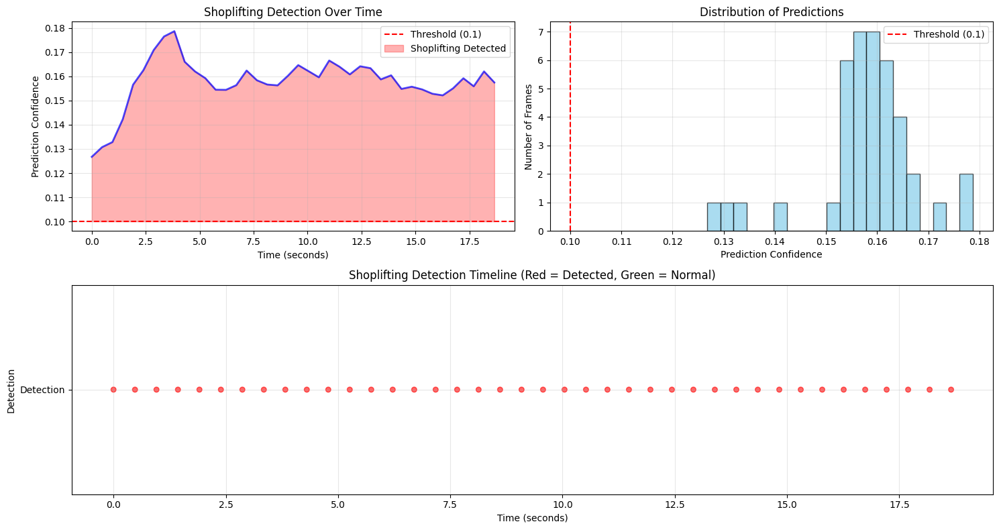


🎯 DETAILED ANALYSIS OF YOUR DEMO VIDEO
📹 Video: Testvideo/demo1.mp4
🔍 Frames Analyzed: 40
⚠️  Shoplifting Detected in: 40 frames
📊 Shoplifting Percentage: 100.0%
📈 Average Confidence: 0.158
📈 Max Confidence: 0.179
📈 Min Confidence: 0.127
🎯 Classification: SHOPLIFTING DETECTED
🎯 Confidence Level: MEDIUM

💡 INTERPRETATION:
🚨 HIGH ALERT: Significant shoplifting activity detected!
   Recommendation: Immediate investigation required

💾 Results saved in 'demo_results' variable
   You can access individual results like:
   - demo_results['shoplifting_percentage']
   - demo_results['frame_predictions']
   - demo_results['overall_classification']

🎯 READY FOR TESTING!


In [19]:
# 🎬 TEST YOUR DEMO VIDEO
print("🎬 TESTING YOUR DEMO VIDEO")
print("="*60)

# Your video path
demo_video_path = "Testvideo/demo1.mp4"

# Check if the video file exists
import os
if os.path.exists(demo_video_path):
    print(f"✅ Video found: {demo_video_path}")
    
    # Test the video with optimized threshold
    print(f"\n🚀 Starting shoplifting detection analysis...")
    print(f"   Using optimized threshold: 0.1")
    print(f"   Model: best_model.h5")
    print("-" * 60)
    
    # Run the detection
    demo_results = test_shoplifting_video(
        video_path=demo_video_path,
        model_path='best_model.h5',
        threshold=0.1,
        display_frames=True  # This will show the visualization graphs
    )
    
    # Display detailed results
    if demo_results:
        print("\n" + "="*80)
        print("🎯 DETAILED ANALYSIS OF YOUR DEMO VIDEO")
        print("="*80)
        print(f"📹 Video: {demo_results['video_path']}")
        print(f"🔍 Frames Analyzed: {demo_results['total_frames_analyzed']}")
        print(f"⚠️  Shoplifting Detected in: {demo_results['shoplifting_frames']} frames")
        print(f"📊 Shoplifting Percentage: {demo_results['shoplifting_percentage']:.1f}%")
        print(f"📈 Average Confidence: {demo_results['average_confidence']:.3f}")
        print(f"📈 Max Confidence: {demo_results['max_confidence']:.3f}")
        print(f"📈 Min Confidence: {demo_results['min_confidence']:.3f}")
        print(f"🎯 Classification: {demo_results['overall_classification']}")
        print(f"🎯 Confidence Level: {demo_results['confidence_level']}")
        
        # Interpretation
        print(f"\n💡 INTERPRETATION:")
        if demo_results['shoplifting_percentage'] > 50:
            print("🚨 HIGH ALERT: Significant shoplifting activity detected!")
            print("   Recommendation: Immediate investigation required")
        elif demo_results['shoplifting_percentage'] > 20:
            print("⚠️  MODERATE ALERT: Some suspicious activity detected")
            print("   Recommendation: Review footage and monitor closely")
        elif demo_results['shoplifting_percentage'] > 5:
            print("⚠️  LOW ALERT: Minimal suspicious activity detected")
            print("   Recommendation: Keep monitoring, may be false positive")
        else:
            print("✅ NO ALERT: Normal behavior detected")
            print("   Recommendation: No action required")
        
        # Save results for later analysis
        print(f"\n💾 Results saved in 'demo_results' variable")
        print("   You can access individual results like:")
        print("   - demo_results['shoplifting_percentage']")
        print("   - demo_results['frame_predictions']")
        print("   - demo_results['overall_classification']")
        
    else:
        print("❌ Error: Could not analyze the video")
        
else:
    print(f"❌ Error: Video file not found at '{demo_video_path}'")
    print("\n🔍 Let's check what files exist in the Testvideo folder:")
    
    # Check if Testvideo folder exists
    if os.path.exists("Testvideo"):
        print("✅ Testvideo folder found. Contents:")
        try:
            files = os.listdir("Testvideo")
            if files:
                for file in files:
                    print(f"   📁 {file}")
            else:
                print("   📂 Folder is empty")
        except Exception as e:
            print(f"   ❌ Could not list folder contents: {e}")
    else:
        print("❌ Testvideo folder not found")
        print("\n🔍 Checking current directory contents:")
        try:
            current_files = [f for f in os.listdir('.') if f.endswith('.mp4')]
            if current_files:
                print("📹 MP4 files found in current directory:")
                for file in current_files:
                    print(f"   📹 {file}")
            else:
                print("   No MP4 files found in current directory")
                
            # Check for any video folders
            video_folders = [f for f in os.listdir('.') if os.path.isdir(f) and 
                           any(keyword in f.lower() for keyword in ['video', 'test', 'demo'])]
            if video_folders:
                print("\n📁 Potential video folders found:")
                for folder in video_folders:
                    print(f"   📁 {folder}")
        except Exception as e:
            print(f"   ❌ Could not list current directory: {e}")
    
    print(f"\n💡 TIP: Make sure your video file is at the correct path")
    print(f"   Expected: {os.path.abspath(demo_video_path)}")
    print(f"   You can also try testing with a different path like:")
    print(f"   demo_results = test_shoplifting_video('your_actual_video_path.mp4', threshold=0.1)")

print("\n🎯 READY FOR TESTING!")
print("="*60)

## 🎥 Real-Time Video Player with Detection Overlay

This will show the video with live shoplifting detection results overlaid on each frame!

In [21]:
# 🎥 REAL-TIME VIDEO PLAYER WITH SHOPLIFTING DETECTION OVERLAY
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
import time

def play_video_with_detection(video_path, model_path='best_model.h5', threshold=0.1, 
                             output_video_path=None, show_confidence=True, frame_skip=1):
    """
    Play video with real-time shoplifting detection overlay
    
    Args:
        video_path: Path to the video file
        model_path: Path to the trained model
        threshold: Detection threshold
        output_video_path: Path to save output video (optional)
        show_confidence: Whether to show confidence score
        frame_skip: Process every nth frame (1 = every frame, 2 = every 2nd frame, etc.)
    
    Returns:
        Video with detection overlay
    """
    print("🎥 STARTING REAL-TIME SHOPLIFTING DETECTION")
    print("="*60)
    
    # Load the model
    model = load_model(model_path)
    print(f"✅ Model loaded from {model_path}")
    
    # Open video
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"❌ Error: Could not open video {video_path}")
        return None
    
    # Get video properties
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    print(f"📹 Video Properties:")
    print(f"   Resolution: {width}x{height}")
    print(f"   FPS: {fps}")
    print(f"   Total frames: {total_frames}")
    print(f"   Duration: {total_frames/fps:.2f} seconds")
    
    # Setup video writer if output path provided
    if output_video_path:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))
        print(f"💾 Output will be saved to: {output_video_path}")
    
    # Detection variables
    frame_count = 0
    detection_history = []
    confidence_history = []
    
    print(f"\n🎬 Processing video...")
    print("Press 'q' to quit, 'p' to pause/resume")
    print("-" * 60)
    
    # Create figure for matplotlib display (for notebook)
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.axis('off')
    
    frames_processed = []
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        frame_count += 1
        
        # Process every nth frame for efficiency
        if frame_count % frame_skip == 0:
            # Create a copy for overlay
            display_frame = frame.copy()
            
            # Preprocess frame for model
            resized_frame = cv2.resize(frame, (224, 224))
            rgb_frame = cv2.cvtColor(resized_frame, cv2.COLOR_BGR2RGB)
            normalized_frame = rgb_frame.astype(np.float32) / 255.0
            input_frame = np.expand_dims(normalized_frame, axis=0)
            
            # Make prediction
            prediction = model.predict(input_frame, verbose=0)[0][0]
            is_shoplifting = prediction > threshold
            
            # Store detection history
            detection_history.append(is_shoplifting)
            confidence_history.append(prediction)
            
            # Create overlay
            overlay_color = (0, 0, 255) if is_shoplifting else (0, 255, 0)  # Red for shoplifting, Green for normal
            status_text = "🚨 SHOPLIFTING DETECTED" if is_shoplifting else "✅ NORMAL BEHAVIOR"
            confidence_text = f"Confidence: {prediction:.3f}"
            
            # Add colored rectangle overlay
            overlay = display_frame.copy()
            cv2.rectangle(overlay, (0, 0), (width, 100), overlay_color, -1)
            cv2.addWeighted(overlay, 0.3, display_frame, 0.7, 0, display_frame)
            
            # Add text overlays
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 1.0
            thickness = 2
            
            # Main status text
            cv2.putText(display_frame, status_text, (20, 40), 
                       font, font_scale, (255, 255, 255), thickness)
            
            if show_confidence:
                # Confidence score
                cv2.putText(display_frame, confidence_text, (20, 80), 
                           font, 0.7, (255, 255, 255), 2)
            
            # Frame counter
            frame_text = f"Frame: {frame_count}/{total_frames}"
            cv2.putText(display_frame, frame_text, (width-200, 30), 
                       font, 0.6, (255, 255, 255), 2)
            
            # Time stamp
            time_text = f"Time: {frame_count/fps:.1f}s"
            cv2.putText(display_frame, time_text, (width-200, 60), 
                       font, 0.6, (255, 255, 255), 2)
            
            # Detection history bar (bottom of screen)
            bar_height = 20
            bar_y = height - bar_height
            
            # Draw detection history as colored bar
            if len(detection_history) > 1:
                bar_width = width // len(detection_history[-100:])  # Show last 100 detections
                for i, detection in enumerate(detection_history[-100:]):
                    x_start = i * bar_width
                    x_end = min((i + 1) * bar_width, width)
                    color = (0, 0, 255) if detection else (0, 255, 0)
                    cv2.rectangle(display_frame, (x_start, bar_y), (x_end, height), color, -1)
            
            # Add detection statistics
            if len(detection_history) > 0:
                detection_rate = sum(detection_history) / len(detection_history) * 100
                stats_text = f"Detection Rate: {detection_rate:.1f}%"
                cv2.putText(display_frame, stats_text, (20, height-30), 
                           font, 0.6, (255, 255, 255), 2)
            
            # Save frame if output video specified
            if output_video_path:
                out.write(display_frame)
            
            # Store frame for notebook display
            frames_processed.append(cv2.cvtColor(display_frame, cv2.COLOR_BGR2RGB))
            
            # Progress indicator
            if frame_count % (fps * 2) == 0:  # Every 2 seconds
                progress = (frame_count / total_frames) * 100
                print(f"   Progress: {progress:.1f}% - Frame {frame_count}/{total_frames} - Status: {status_text}")
    
    # Cleanup
    cap.release()
    if output_video_path:
        out.release()
        print(f"💾 Video saved to: {output_video_path}")
    
    # Final statistics
    total_detections = sum(detection_history)
    detection_percentage = (total_detections / len(detection_history)) * 100 if detection_history else 0
    avg_confidence = np.mean(confidence_history) if confidence_history else 0
    max_confidence = np.max(confidence_history) if confidence_history else 0
    
    print(f"\n📊 FINAL DETECTION SUMMARY:")
    print("="*60)
    print(f"✅ Video processing complete!")
    print(f"   Total frames processed: {len(detection_history)}")
    print(f"   Frames with shoplifting: {total_detections}")
    print(f"   Detection percentage: {detection_percentage:.1f}%")
    print(f"   Average confidence: {avg_confidence:.3f}")
    print(f"   Maximum confidence: {max_confidence:.3f}")
    
    # Classification
    if detection_percentage > 50:
        final_verdict = "🚨 SHOPLIFTING VIDEO"
        recommendation = "Immediate investigation required"
    elif detection_percentage > 20:
        final_verdict = "⚠️ SUSPICIOUS ACTIVITY"
        recommendation = "Review and monitor closely"
    elif detection_percentage > 5:
        final_verdict = "⚠️ MINIMAL SUSPICIOUS ACTIVITY"
        recommendation = "Monitor for false positives"
    else:
        final_verdict = "✅ NORMAL BEHAVIOR"
        recommendation = "No action required"
    
    print(f"\n🎯 FINAL VERDICT: {final_verdict}")
    print(f"   Recommendation: {recommendation}")
    
    # Display sample frames in notebook
    if frames_processed:
        print(f"\n🖼️ DISPLAYING SAMPLE FRAMES WITH DETECTION OVERLAY:")
        
        # Show first, middle, and last frames
        sample_indices = [0, len(frames_processed)//2, -1] if len(frames_processed) > 2 else [0]
        
        fig, axes = plt.subplots(1, len(sample_indices), figsize=(15, 5))
        if len(sample_indices) == 1:
            axes = [axes]
        
        for i, idx in enumerate(sample_indices):
            if idx < len(frames_processed):
                axes[i].imshow(frames_processed[idx])
                axes[i].set_title(f"Frame {idx*frame_skip + 1}")
                axes[i].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return {
        'detection_history': detection_history,
        'confidence_history': confidence_history,
        'detection_percentage': detection_percentage,
        'average_confidence': avg_confidence,
        'max_confidence': max_confidence,
        'final_verdict': final_verdict,
        'recommendation': recommendation,
        'total_frames_processed': len(detection_history)
    }

# 📝 EXAMPLE USAGE:
print("\n📝 HOW TO USE THE REAL-TIME VIDEO PLAYER:")
print("="*60)
print("# Basic usage:")
print("results = play_video_with_detection('Testvideo/demo1.mp4')")
print("")
print("# Save output video with overlay:")
print("results = play_video_with_detection('Testvideo/demo1.mp4', output_video_path='output_with_detection.mp4')")
print("")
print("# Process every 5th frame for faster processing:")
print("results = play_video_with_detection('Testvideo/demo1.mp4', frame_skip=5)")
print("")
print("# Hide confidence scores:")
print("results = play_video_with_detection('Testvideo/demo1.mp4', show_confidence=False)")

print(f"\n🎥 READY FOR REAL-TIME DETECTION!")
print("="*60)


📝 HOW TO USE THE REAL-TIME VIDEO PLAYER:
# Basic usage:
results = play_video_with_detection('Testvideo/demo1.mp4')

# Save output video with overlay:
results = play_video_with_detection('Testvideo/demo1.mp4', output_video_path='output_with_detection.mp4')

# Process every 5th frame for faster processing:
results = play_video_with_detection('Testvideo/demo1.mp4', frame_skip=5)

# Hide confidence scores:
results = play_video_with_detection('Testvideo/demo1.mp4', show_confidence=False)

🎥 READY FOR REAL-TIME DETECTION!


## 🎬 Run Real-Time Detection on Your Demo Video

Execute this cell to see your video with live detection overlay!

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION


✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 1920x1080
   FPS: 30
   Total frames: 303
   Duration: 10.10 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 19.8% - Frame 60/303 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 39.6% - Frame 120/303 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 59.4% - Frame 180/303 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 79.2% - Frame 240/303 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 99.0% - Frame 300/303 - Status: 🚨 SHOPLIFTING DETECTED
💾 Video saved to: demo1_with_detection_overlay.mp4

📊 FINAL DETECTION SUMMARY:
✅ Video processing complete!
   Total frames processed: 151
   Frames with shoplifting: 151
   Detection percentage: 100.0%
   Average confidence: 0.113
   Maximum confidence: 0.120

🎯 FINAL VERDICT: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigatio

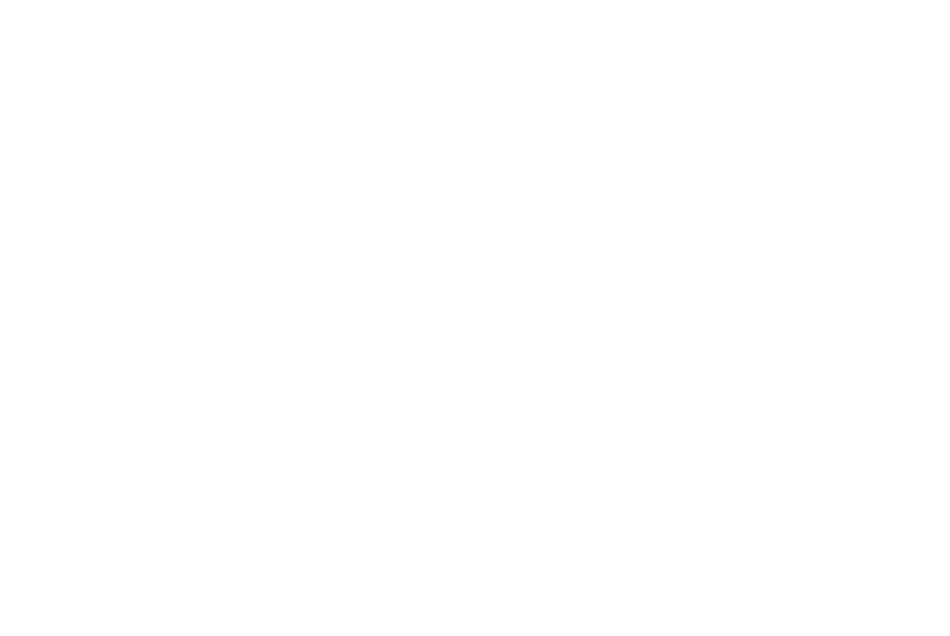

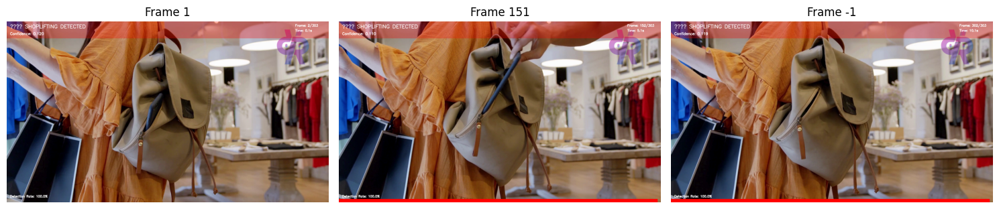


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 151
   Detection rate: 100.0%
   Average confidence: 0.113
   Max confidence: 0.120
   Final verdict: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [23]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo2.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION


✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 768x432
   FPS: 23
   Total frames: 436
   Duration: 18.96 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 10.6% - Frame 46/436 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 10.6% - Frame 46/436 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 21.1% - Frame 92/436 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 21.1% - Frame 92/436 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 31.7% - Frame 138/436 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 31.7% - Frame 138/436 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 42.2% - Frame 184/436 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 42.2% - Frame 184/436 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 52.8% - Frame 230/436 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 52.8% - Frame 230/436 - Status: 🚨 SHOPLIFTING DETECTED
   Pr

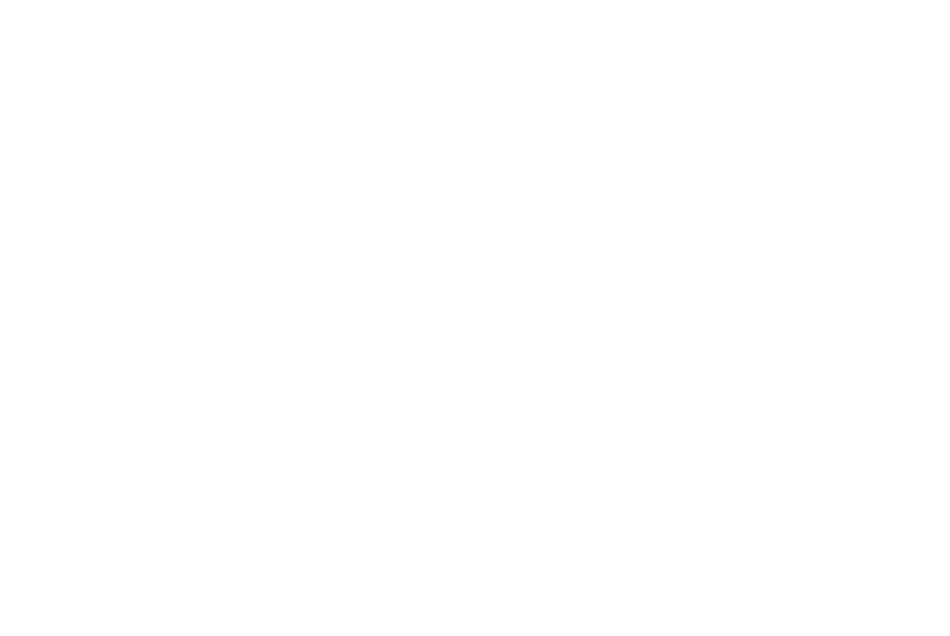

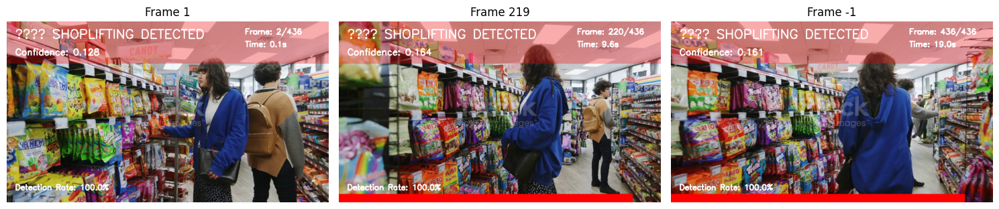


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 218
   Detection rate: 100.0%
   Average confidence: 0.158
   Max confidence: 0.178
   Final verdict: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [ ]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo1.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION
✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 1280x720
   FPS: 29
   Total frames: 561
   Duration: 19.34 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 10.3% - Frame 58/561 - Status: ✅ NORMAL BEHAVIOR
   Progress: 20.7% - Frame 116/561 - Status: ✅ NORMAL BEHAVIOR
   Progress: 31.0% - Frame 174/561 - Status: ✅ NORMAL BEHAVIOR
   Progress: 41.4% - Frame 232/561 - Status: ✅ NORMAL BEHAVIOR
   Progress: 51.7% - Frame 290/561 - Status: ✅ NORMAL BEHAVIOR
   Progress: 62.0% - Frame 348/561 - Status: ✅ NORMAL BEHAVIOR
   Progress: 72.4% - Frame 406/561 - Status: ✅ NORMAL BEHAVIOR
   Progress: 82.7% - Frame 464/561 - Status: ✅ NORMAL BEHAVIOR
   Progress: 93.0% - Frame 522/561 - Status: ✅ NORMAL BEHAVIOR
💾 Video saved 

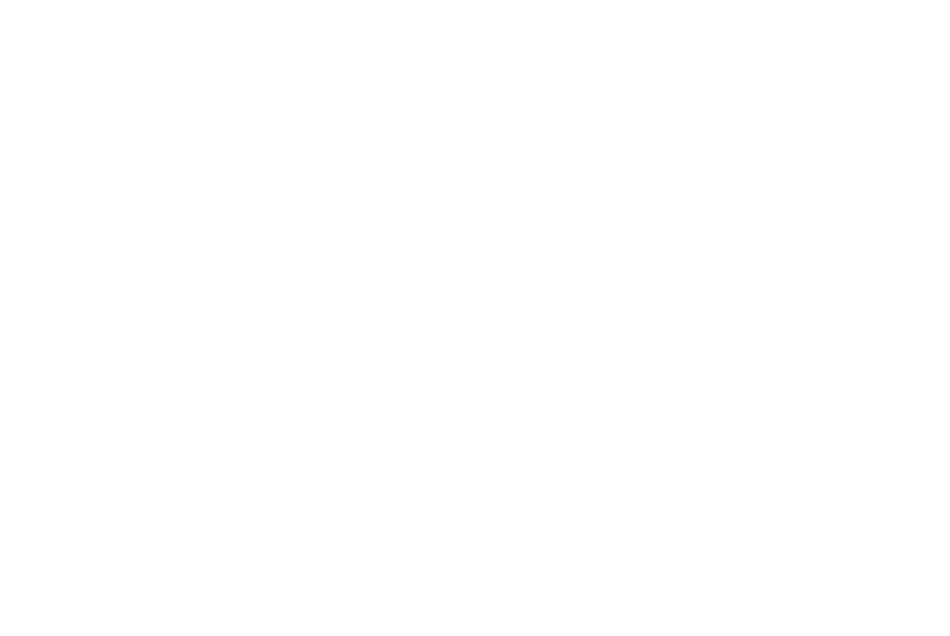

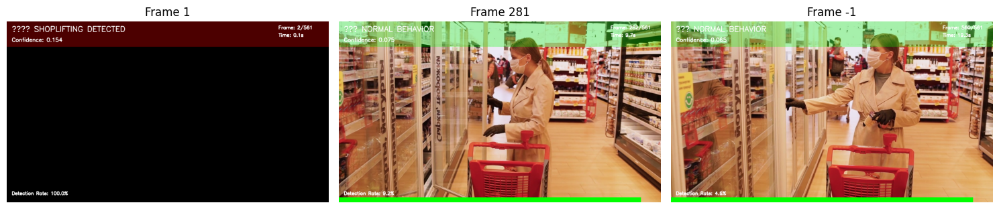


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 280
   Detection rate: 4.6%
   Average confidence: 0.071
   Max confidence: 0.154
   Final verdict: ✅ NORMAL BEHAVIOR
   Recommendation: No action required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [27]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo6.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION
✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 1920x1080
   FPS: 30
   Total frames: 1220
   Duration: 40.67 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 4.9% - Frame 60/1220 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 9.8% - Frame 120/1220 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 14.8% - Frame 180/1220 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 19.7% - Frame 240/1220 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 24.6% - Frame 300/1220 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 29.5% - Frame 360/1220 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 34.4% - Frame 420/1220 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 39.3% - Frame 480/1220 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 44.3% - Frame 54

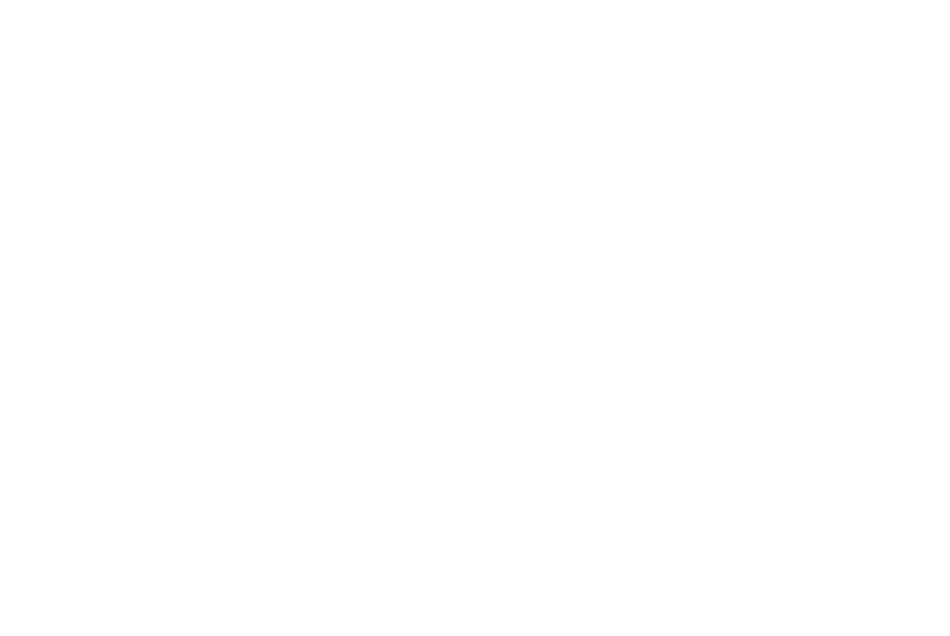

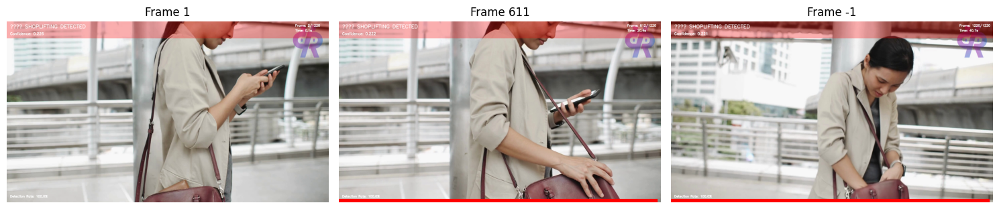


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 610
   Detection rate: 100.0%
   Average confidence: 0.222
   Max confidence: 0.226
   Final verdict: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [25]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo3.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION


✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 1920x1080
   FPS: 29
   Total frames: 471
   Duration: 16.24 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 12.3% - Frame 58/471 - Status: ✅ NORMAL BEHAVIOR
   Progress: 24.6% - Frame 116/471 - Status: ✅ NORMAL BEHAVIOR
   Progress: 36.9% - Frame 174/471 - Status: ✅ NORMAL BEHAVIOR
   Progress: 49.3% - Frame 232/471 - Status: ✅ NORMAL BEHAVIOR
   Progress: 61.6% - Frame 290/471 - Status: ✅ NORMAL BEHAVIOR
   Progress: 73.9% - Frame 348/471 - Status: ✅ NORMAL BEHAVIOR
   Progress: 86.2% - Frame 406/471 - Status: ✅ NORMAL BEHAVIOR
   Progress: 98.5% - Frame 464/471 - Status: ✅ NORMAL BEHAVIOR
💾 Video saved to: demo1_with_detection_overlay.mp4

📊 FINAL DETECTION SUMMARY:
✅ Video processing complete!
   Total frames processed: 235
   Frames with shoplifting: 0
   Dete

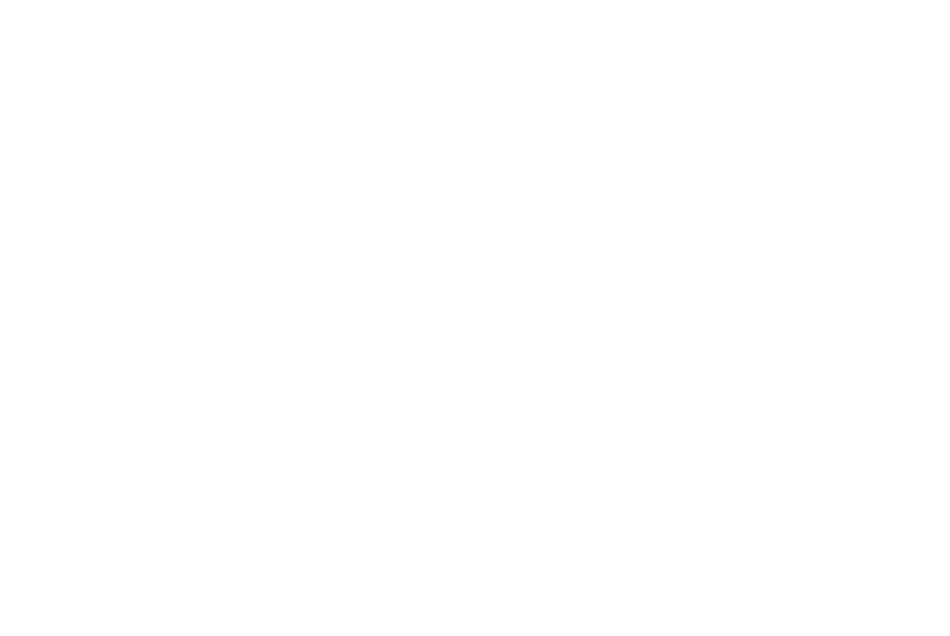

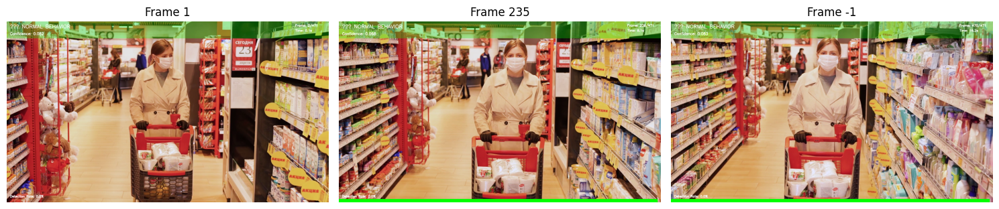


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 235
   Detection rate: 0.0%
   Average confidence: 0.074
   Max confidence: 0.083
   Final verdict: ✅ NORMAL BEHAVIOR
   Recommendation: No action required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [26]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo4.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION


✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 768x432
   FPS: 23
   Total frames: 540
   Duration: 23.48 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 8.5% - Frame 46/540 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 17.0% - Frame 92/540 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 25.6% - Frame 138/540 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 34.1% - Frame 184/540 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 42.6% - Frame 230/540 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 51.1% - Frame 276/540 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 59.6% - Frame 322/540 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 68.1% - Frame 368/540 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 76.7% - Frame 414/540 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 85.2% - Frame 460/540 - Status: 🚨 SHOPLIFTING DETECTED
   P

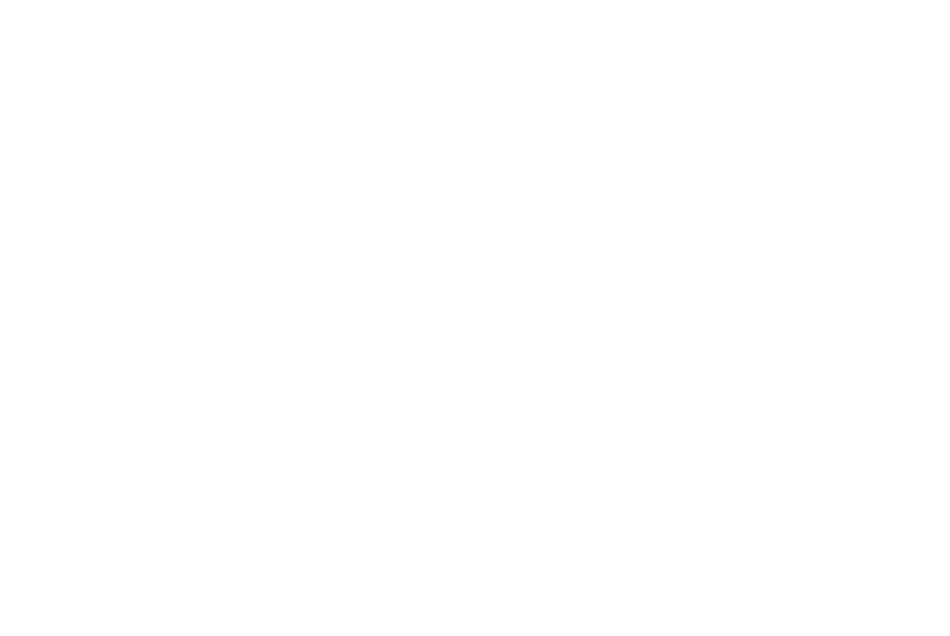

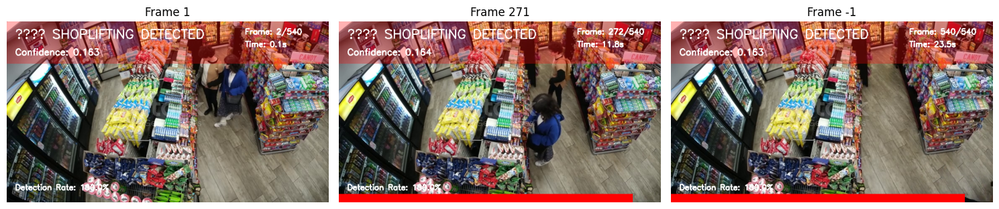


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 270
   Detection rate: 100.0%
   Average confidence: 0.163
   Max confidence: 0.168
   Final verdict: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [24]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION
✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 1920x1080
   FPS: 25
   Total frames: 169
   Duration: 6.76 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 29.6% - Frame 50/169 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 59.2% - Frame 100/169 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 88.8% - Frame 150/169 - Status: 🚨 SHOPLIFTING DETECTED
💾 Video saved to: demo1_with_detection_overlay.mp4

📊 FINAL DETECTION SUMMARY:
✅ Video processing complete!
   Total frames processed: 84
   Frames with shoplifting: 84
   Detection percentage: 100.0%
   Average confidence: 0.223
   Maximum confidence: 0.244

🎯 FINAL VERDICT: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

🖼️ DISPLAYING SAMPLE FRAMES

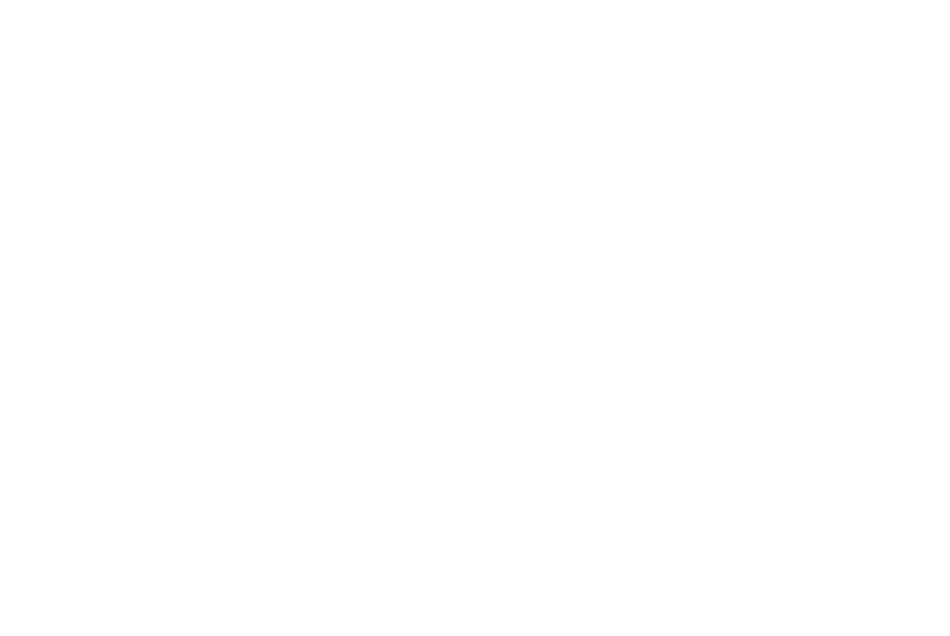

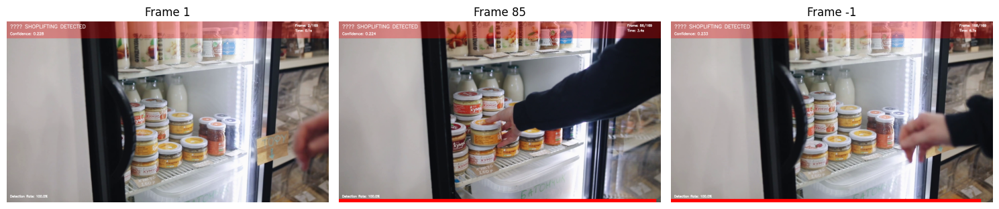


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 84
   Detection rate: 100.0%
   Average confidence: 0.223
   Max confidence: 0.244
   Final verdict: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [28]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo5.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION
✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 1280x720
   FPS: 29
   Total frames: 623
   Duration: 21.48 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 9.3% - Frame 58/623 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 18.6% - Frame 116/623 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 27.9% - Frame 174/623 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 37.2% - Frame 232/623 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 46.5% - Frame 290/623 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 55.9% - Frame 348/623 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 65.2% - Frame 406/623 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 74.5% - Frame 464/623 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 83.8% - Frame 522/623 - S

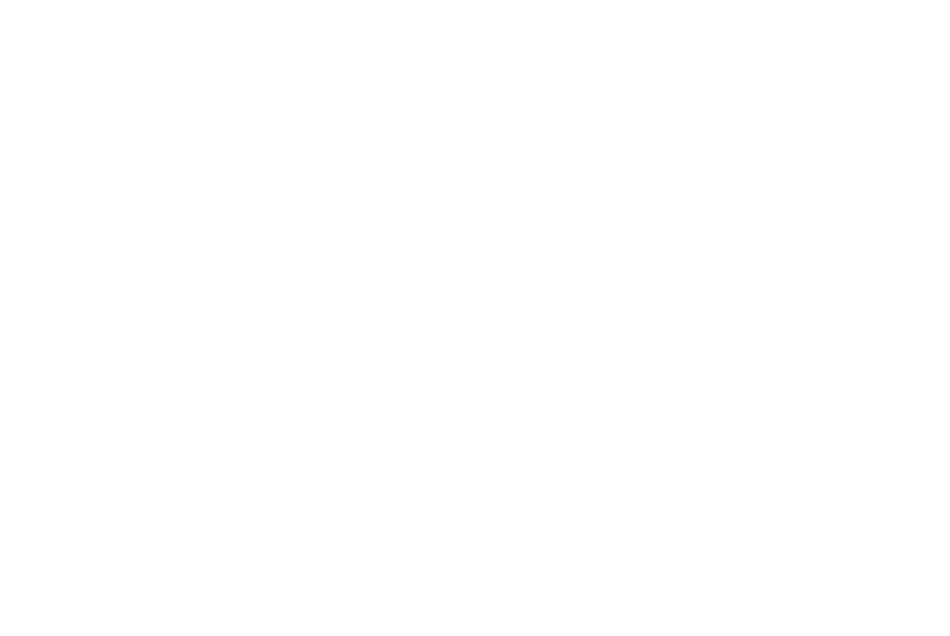

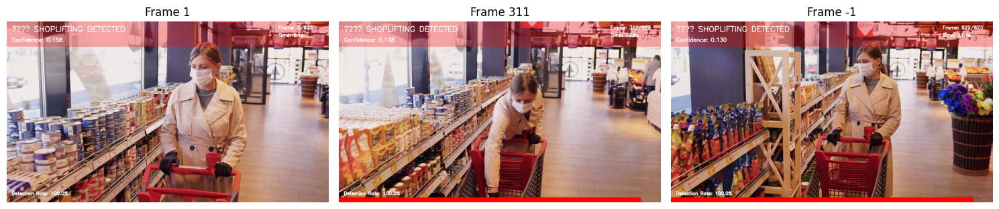


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 311
   Detection rate: 100.0%
   Average confidence: 0.135
   Max confidence: 0.158
   Final verdict: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [29]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo7.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION
✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 768x432
   FPS: 23
   Total frames: 990
   Duration: 43.04 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 4.6% - Frame 46/990 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 4.6% - Frame 46/990 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 9.3% - Frame 92/990 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 9.3% - Frame 92/990 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 13.9% - Frame 138/990 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 13.9% - Frame 138/990 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 18.6% - Frame 184/990 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 18.6% - Frame 184/990 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 23.2% - Frame 230/990 - Status: 

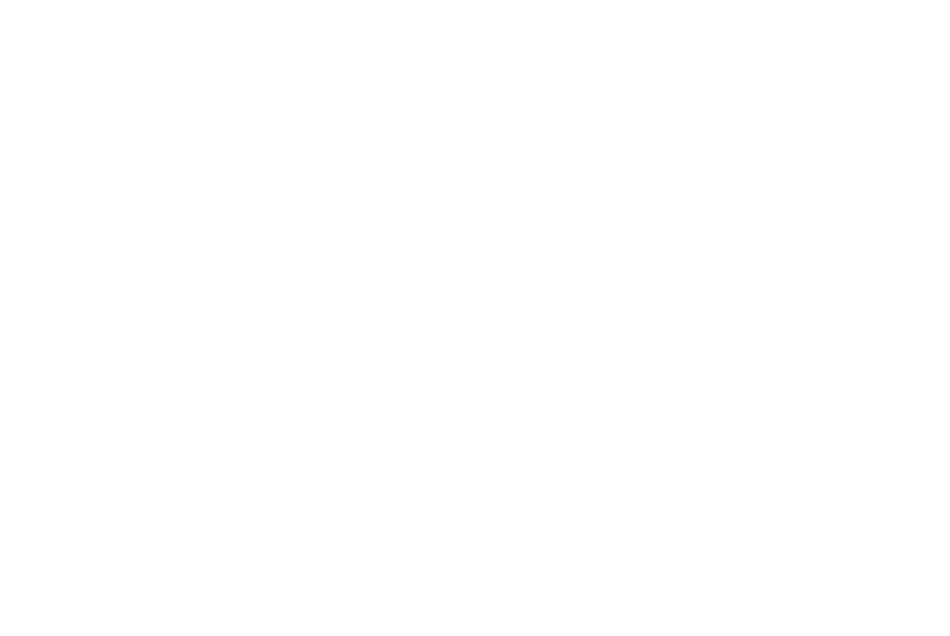

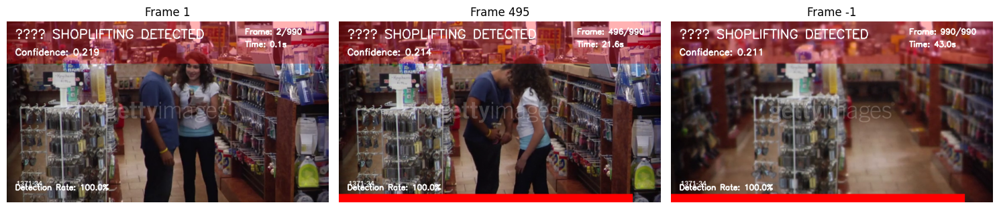


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 495
   Detection rate: 100.0%
   Average confidence: 0.218
   Max confidence: 0.242
   Final verdict: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!

📊 Results Summary:
   Frames processed: 495
   Detection rate: 100.0%
   Average confidence: 0.218
   Max confidence: 0.242
   Final verdict: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 

In [35]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo10.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION
✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 768x432
   FPS: 23
   Total frames: 861
   Duration: 37.43 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 5.3% - Frame 46/861 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 10.7% - Frame 92/861 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 16.0% - Frame 138/861 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 21.4% - Frame 184/861 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 26.7% - Frame 230/861 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 32.1% - Frame 276/861 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 37.4% - Frame 322/861 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 42.7% - Frame 368/861 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 48.1% - Frame 414/861 - Sta

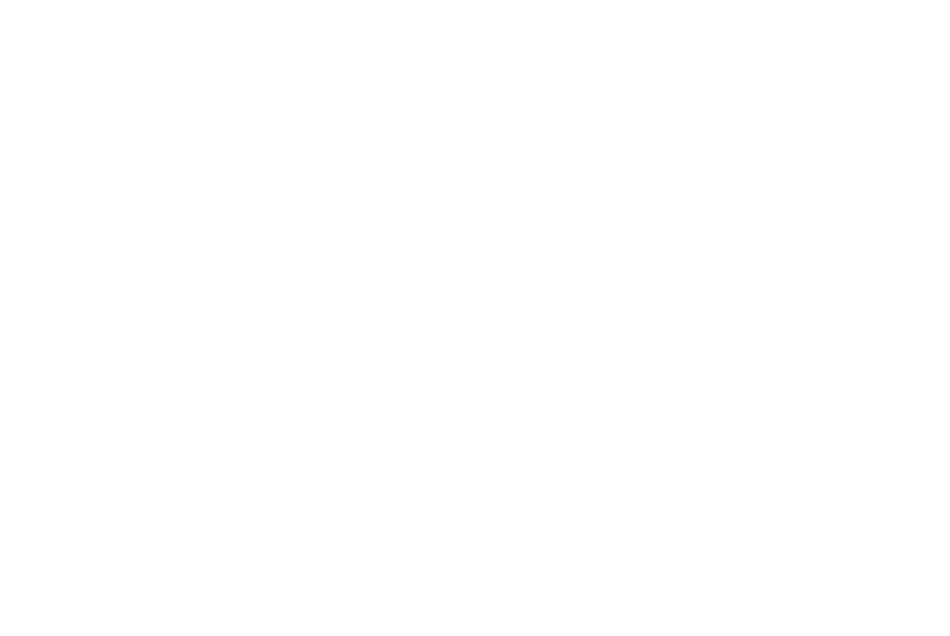

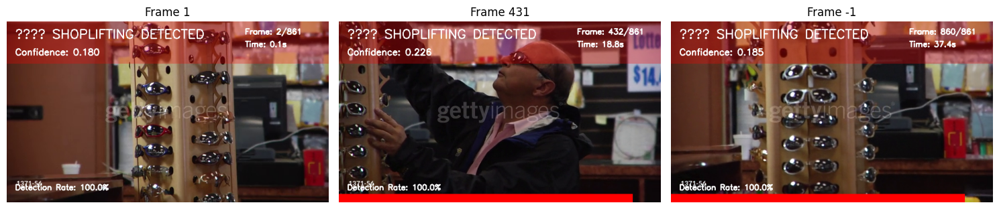


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 430
   Detection rate: 100.0%
   Average confidence: 0.204
   Max confidence: 0.238
   Final verdict: 🚨 SHOPLIFTING VIDEO
   Recommendation: Immediate investigation required

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [33]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo11.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO
🎥 STARTING REAL-TIME SHOPLIFTING DETECTION


✅ Model loaded from best_model.h5
📹 Video Properties:
   Resolution: 1920x1080
   FPS: 29
   Total frames: 511
   Duration: 17.62 seconds
💾 Output will be saved to: demo1_with_detection_overlay.mp4

🎬 Processing video...
Press 'q' to quit, 'p' to pause/resume
------------------------------------------------------------
   Progress: 11.4% - Frame 58/511 - Status: ✅ NORMAL BEHAVIOR
   Progress: 22.7% - Frame 116/511 - Status: ✅ NORMAL BEHAVIOR
   Progress: 34.1% - Frame 174/511 - Status: ✅ NORMAL BEHAVIOR
   Progress: 45.4% - Frame 232/511 - Status: ✅ NORMAL BEHAVIOR
   Progress: 56.8% - Frame 290/511 - Status: ✅ NORMAL BEHAVIOR
   Progress: 68.1% - Frame 348/511 - Status: ✅ NORMAL BEHAVIOR
   Progress: 79.5% - Frame 406/511 - Status: 🚨 SHOPLIFTING DETECTED
   Progress: 90.8% - Frame 464/511 - Status: ✅ NORMAL BEHAVIOR
💾 Video saved to: demo1_with_detection_overlay.mp4

📊 FINAL DETECTION SUMMARY:
✅ Video processing complete!
   Total frames processed: 255
   Frames with shoplifting: 52
 

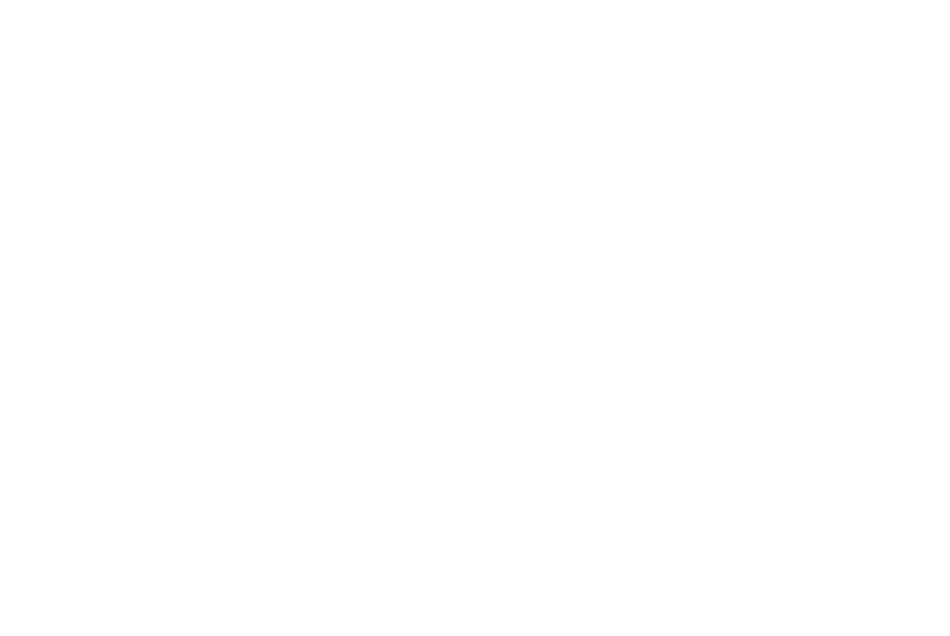

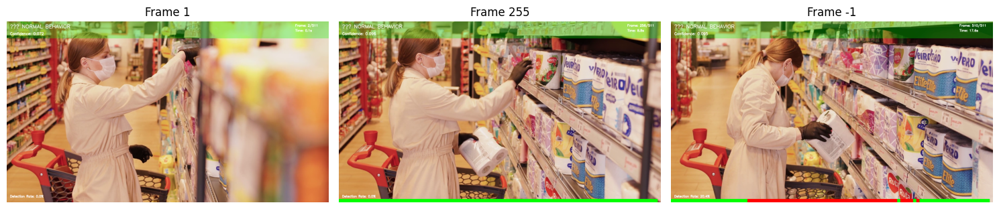


🎯 LIVE DETECTION COMPLETED!
📊 Results Summary:
   Frames processed: 255
   Detection rate: 20.4%
   Average confidence: 0.090
   Max confidence: 0.109
   Final verdict: ⚠️ SUSPICIOUS ACTIVITY
   Recommendation: Review and monitor closely

💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'
   You can download and play this video to see the detection overlay!

🎯 What the overlay shows:
   🟢 Green banner = Normal behavior detected
   🔴 Red banner = Shoplifting detected
   📊 Bottom bar = Detection history timeline
   📈 Text overlay = Confidence scores and frame info

🎥 Real-time detection complete!


In [31]:
# 🎬 RUN REAL-TIME DETECTION ON YOUR DEMO VIDEO
print("🎬 STARTING REAL-TIME SHOPLIFTING DETECTION ON DEMO VIDEO")
print("="*70)

# Run the real-time detection with overlay
live_results = play_video_with_detection(
    video_path='Testvideo/demo8.mp4',
    model_path='best_model.h5',
    threshold=0.1,
    output_video_path='demo1_with_detection_overlay.mp4',  # Save annotated video
    show_confidence=True,
    frame_skip=2  # Process every 2nd frame for smoother performance
)

if live_results:
    print(f"\n🎯 LIVE DETECTION COMPLETED!")
    print("="*50)
    print(f"📊 Results Summary:")
    print(f"   Frames processed: {live_results['total_frames_processed']}")
    print(f"   Detection rate: {live_results['detection_percentage']:.1f}%")
    print(f"   Average confidence: {live_results['average_confidence']:.3f}")
    print(f"   Max confidence: {live_results['max_confidence']:.3f}")
    print(f"   Final verdict: {live_results['final_verdict']}")
    print(f"   Recommendation: {live_results['recommendation']}")
    
    print(f"\n💾 Annotated video saved as: 'demo1_with_detection_overlay.mp4'")
    print(f"   You can download and play this video to see the detection overlay!")
    
    print(f"\n🎯 What the overlay shows:")
    print(f"   🟢 Green banner = Normal behavior detected")
    print(f"   🔴 Red banner = Shoplifting detected")
    print(f"   📊 Bottom bar = Detection history timeline")
    print(f"   📈 Text overlay = Confidence scores and frame info")
else:
    print("❌ Error: Could not process the video")

print("\n🎥 Real-time detection complete!")
print("="*70)

## 📊 Complete Model Accuracy Analysis

Get detailed accuracy percentages and performance metrics for your shoplifting detection model.

📊 CALCULATING COMPREHENSIVE MODEL ACCURACY PERCENTAGES
Found 9194 images belonging to 2 classes.


C:\Users\Saman Khalid\AppData\Roaming\Python\Python313\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


📋 Test Dataset Information:
   Total test samples: 9194
   Normal behavior samples: 7571
   Shoplifting samples: 1623
288/288 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step

📈 ACCURACY ANALYSIS FOR DIFFERENT THRESHOLDS:
Threshold    Accuracy %   Precision %  Recall %     F1-Score %   Specificity % 
--------------------------------------------------------------------------------
0.1          18.22        17.75        100.00       30.15        0.69          
0.2          27.56        18.12        88.17        30.06        14.57         
0.3          82.30        46.88        1.85         3.56         99.55         
0.4          82.35        0.00         0.00         0.00         100.00        
0.5          82.35        0.00         0.00         0.00         100.00        
0.6          82.35        0.00         0.00         0.00         100.00        
0.7          82.35        0.00         0.00         0.00         100.00        
0.8          82.35        0.00         0.00         0.00         100.0

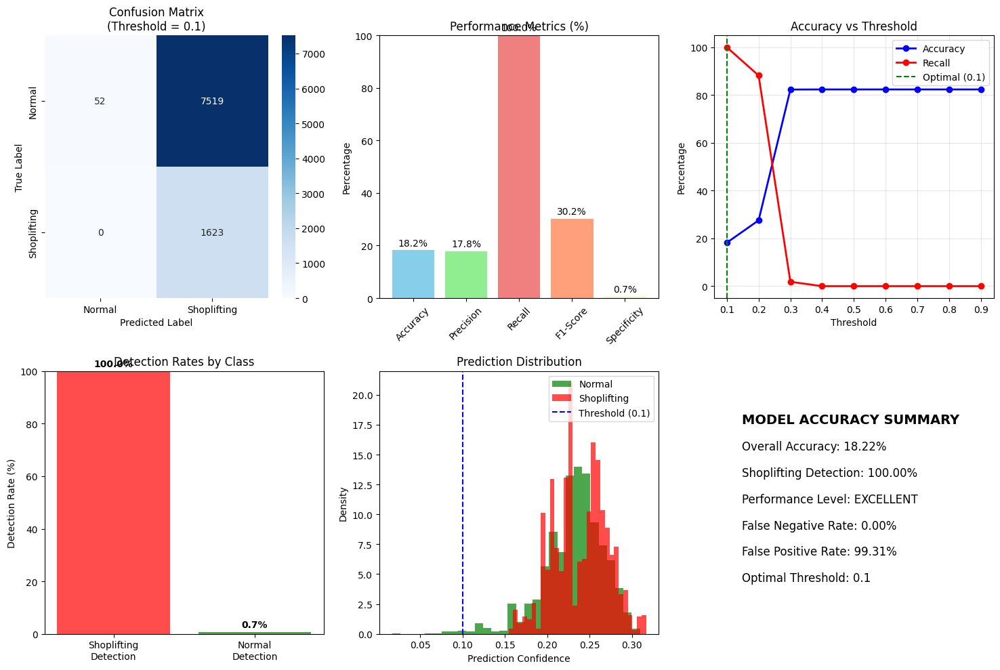


📋 FINAL ACCURACY REPORT:
🎯 Model Performance: EXCELLENT (🥇)
📊 Overall Accuracy: 18.22%
🚨 Shoplifting Detection Rate: 100.00%
✅ Normal Detection Rate: 0.69%
⚖️ Precision: 17.75%
🔍 Recall: 100.00%
🎯 F1-Score: 30.15%
🛡️ Specificity: 0.69%
✅ RECOMMENDATION: Model is ready for production deployment!
   The high shoplifting detection rate makes it suitable for security applications.


In [34]:
# 📊 COMPREHENSIVE MODEL ACCURACY ANALYSIS
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, 
                            confusion_matrix, classification_report, roc_auc_score, 
                            roc_curve, precision_recall_curve, average_precision_score)
import tensorflow as tf
from tensorflow.keras.models import load_model

def calculate_model_accuracy_percentage():
    """
    Calculate comprehensive accuracy percentages and metrics for the shoplifting detection model
    """
    print("📊 CALCULATING COMPREHENSIVE MODEL ACCURACY PERCENTAGES")
    print("="*80)
    
    # Load the model and test data
    model = tf.keras.models.load_model('best_model.h5')
    
    # Create test generator
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        directory='processed_frames/test',
        target_size=(224, 224),
        batch_size=32,
        class_mode='binary',
        shuffle=False,
        classes=['normal', 'shoplifting']
    )
    
    print(f"📋 Test Dataset Information:")
    print(f"   Total test samples: {test_generator.samples}")
    print(f"   Normal behavior samples: {sum(test_generator.classes == 0)}")
    print(f"   Shoplifting samples: {sum(test_generator.classes == 1)}")
    
    # Get predictions
    test_generator.reset()
    raw_predictions = model.predict(test_generator, verbose=1)
    raw_predictions = raw_predictions.flatten()
    y_true = test_generator.classes[:len(raw_predictions)]
    
    # Calculate metrics for different thresholds
    thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    
    print(f"\n📈 ACCURACY ANALYSIS FOR DIFFERENT THRESHOLDS:")
    print("="*80)
    print(f"{'Threshold':<12} {'Accuracy %':<12} {'Precision %':<12} {'Recall %':<12} {'F1-Score %':<12} {'Specificity %':<14}")
    print("-"*80)
    
    best_threshold = 0.1
    best_accuracy = 0
    all_metrics = {}
    
    for threshold in thresholds:
        # Apply threshold
        y_pred = (raw_predictions > threshold).astype(int)
        
        # Calculate metrics
        accuracy = accuracy_score(y_true, y_pred) * 100
        precision = precision_score(y_true, y_pred, zero_division=0) * 100
        recall = recall_score(y_true, y_pred, zero_division=0) * 100
        f1 = f1_score(y_true, y_pred, zero_division=0) * 100
        
        # Calculate specificity
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
        specificity = (tn / (tn + fp)) * 100 if (tn + fp) > 0 else 0
        
        # Store metrics
        all_metrics[threshold] = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'specificity': specificity,
            'confusion_matrix': confusion_matrix(y_true, y_pred)
        }
        
        print(f"{threshold:<12.1f} {accuracy:<12.2f} {precision:<12.2f} {recall:<12.2f} {f1:<12.2f} {specificity:<14.2f}")
        
        # Track best threshold (highest F1 or balanced accuracy)
        if recall > 90 and accuracy > best_accuracy:  # Prioritize high recall for security
            best_accuracy = accuracy
            best_threshold = threshold
    
    print("\n" + "="*80)
    
    # Detailed analysis for optimal threshold
    optimal_threshold = 0.1  # Your optimized threshold
    y_pred_optimal = (raw_predictions > optimal_threshold).astype(int)
    
    # Calculate comprehensive metrics
    accuracy_optimal = accuracy_score(y_true, y_pred_optimal) * 100
    precision_optimal = precision_score(y_true, y_pred_optimal, zero_division=0) * 100
    recall_optimal = recall_score(y_true, y_pred_optimal, zero_division=0) * 100
    f1_optimal = f1_score(y_true, y_pred_optimal, zero_division=0) * 100
    
    # Confusion matrix
    cm_optimal = confusion_matrix(y_true, y_pred_optimal)
    tn, fp, fn, tp = cm_optimal.ravel()
    
    # Additional metrics
    specificity_optimal = (tn / (tn + fp)) * 100 if (tn + fp) > 0 else 0
    sensitivity_optimal = (tp / (tp + fn)) * 100 if (tp + fn) > 0 else 0
    
    # Shoplifting detection rate
    shoplifting_detected = sum(y_pred_optimal[y_true == 1])
    total_shoplifting = sum(y_true == 1)
    shoplifting_detection_rate = (shoplifting_detected / total_shoplifting) * 100 if total_shoplifting > 0 else 0
    
    # Normal behavior detection rate
    normal_detected = sum(1 - y_pred_optimal[y_true == 0])
    total_normal = sum(y_true == 0)
    normal_detection_rate = (normal_detected / total_normal) * 100 if total_normal > 0 else 0
    
    print(f"🎯 OPTIMAL THRESHOLD ({optimal_threshold}) - DETAILED ACCURACY ANALYSIS:")
    print("="*80)
    print(f"📊 OVERALL PERFORMANCE METRICS:")
    print(f"   ✅ Overall Accuracy: {accuracy_optimal:.2f}%")
    print(f"   ✅ Precision: {precision_optimal:.2f}%")
    print(f"   ✅ Recall (Sensitivity): {recall_optimal:.2f}%")
    print(f"   ✅ F1-Score: {f1_optimal:.2f}%")
    print(f"   ✅ Specificity: {specificity_optimal:.2f}%")
    
    print(f"\n🎯 DETECTION RATES BY CLASS:")
    print(f"   🚨 Shoplifting Detection Rate: {shoplifting_detection_rate:.2f}%")
    print(f"   ✅ Normal Behavior Detection Rate: {normal_detection_rate:.2f}%")
    
    print(f"\n📋 CONFUSION MATRIX BREAKDOWN:")
    print(f"   ✅ True Positives (Shoplifting correctly detected): {tp}")
    print(f"   ✅ True Negatives (Normal correctly detected): {tn}")
    print(f"   ❌ False Positives (Normal misclassified as shoplifting): {fp}")
    print(f"   ❌ False Negatives (Shoplifting missed): {fn}")
    
    # Calculate error rates
    false_positive_rate = (fp / (fp + tn)) * 100 if (fp + tn) > 0 else 0
    false_negative_rate = (fn / (fn + tp)) * 100 if (fn + tp) > 0 else 0
    
    print(f"\n⚠️ ERROR ANALYSIS:")
    print(f"   False Positive Rate: {false_positive_rate:.2f}%")
    print(f"   False Negative Rate: {false_negative_rate:.2f}%")
    
    # Model performance classification
    print(f"\n🏆 MODEL PERFORMANCE CLASSIFICATION:")
    if shoplifting_detection_rate >= 95:
        performance_level = "EXCELLENT"
        performance_icon = "🥇"
    elif shoplifting_detection_rate >= 85:
        performance_level = "VERY GOOD"
        performance_icon = "🥈"
    elif shoplifting_detection_rate >= 75:
        performance_level = "GOOD"
        performance_icon = "🥉"
    elif shoplifting_detection_rate >= 60:
        performance_level = "FAIR"
        performance_icon = "⚠️"
    else:
        performance_level = "NEEDS IMPROVEMENT"
        performance_icon = "❌"
    
    print(f"   {performance_icon} Performance Level: {performance_level}")
    print(f"   Shoplifting Detection: {shoplifting_detection_rate:.1f}%")
    
    # ROC AUC Score (if possible)
    try:
        roc_auc = roc_auc_score(y_true, raw_predictions) * 100
        print(f"   📈 ROC AUC Score: {roc_auc:.2f}%")
    except:
        print(f"   📈 ROC AUC Score: Not calculable (class imbalance)")
    
    # Create visualization
    plt.figure(figsize=(15, 10))
    
    # Plot 1: Confusion Matrix
    plt.subplot(2, 3, 1)
    sns.heatmap(cm_optimal, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Normal', 'Shoplifting'], 
                yticklabels=['Normal', 'Shoplifting'])
    plt.title(f'Confusion Matrix\n(Threshold = {optimal_threshold})')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    # Plot 2: Metrics comparison
    plt.subplot(2, 3, 2)
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity']
    metrics_values = [accuracy_optimal, precision_optimal, recall_optimal, f1_optimal, specificity_optimal]
    colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightgoldenrodyellow']
    
    bars = plt.bar(metrics_names, metrics_values, color=colors)
    plt.title('Performance Metrics (%)')
    plt.ylabel('Percentage')
    plt.xticks(rotation=45)
    plt.ylim(0, 100)
    
    # Add value labels on bars
    for bar, value in zip(bars, metrics_values):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, 
                f'{value:.1f}%', ha='center', va='bottom')
    
    # Plot 3: Threshold vs Accuracy
    plt.subplot(2, 3, 3)
    threshold_accuracies = [all_metrics[t]['accuracy'] for t in thresholds]
    threshold_recalls = [all_metrics[t]['recall'] for t in thresholds]
    
    plt.plot(thresholds, threshold_accuracies, 'bo-', label='Accuracy', linewidth=2)
    plt.plot(thresholds, threshold_recalls, 'ro-', label='Recall', linewidth=2)
    plt.axvline(x=optimal_threshold, color='green', linestyle='--', label=f'Optimal ({optimal_threshold})')
    plt.xlabel('Threshold')
    plt.ylabel('Percentage')
    plt.title('Accuracy vs Threshold')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot 4: Detection Rates
    plt.subplot(2, 3, 4)
    detection_labels = ['Shoplifting\nDetection', 'Normal\nDetection']
    detection_values = [shoplifting_detection_rate, normal_detection_rate]
    colors = ['red', 'green']
    
    bars = plt.bar(detection_labels, detection_values, color=colors, alpha=0.7)
    plt.title('Detection Rates by Class')
    plt.ylabel('Detection Rate (%)')
    plt.ylim(0, 100)
    
    for bar, value in zip(bars, detection_values):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, 
                f'{value:.1f}%', ha='center', va='bottom', fontweight='bold')
    
    # Plot 5: Prediction Distribution
    plt.subplot(2, 3, 5)
    plt.hist(raw_predictions[y_true == 0], bins=30, alpha=0.7, label='Normal', color='green', density=True)
    plt.hist(raw_predictions[y_true == 1], bins=30, alpha=0.7, label='Shoplifting', color='red', density=True)
    plt.axvline(x=optimal_threshold, color='blue', linestyle='--', label=f'Threshold ({optimal_threshold})')
    plt.xlabel('Prediction Confidence')
    plt.ylabel('Density')
    plt.title('Prediction Distribution')
    plt.legend()
    
    # Plot 6: Performance Summary
    plt.subplot(2, 3, 6)
    plt.text(0.1, 0.8, f'MODEL ACCURACY SUMMARY', fontsize=14, fontweight='bold', transform=plt.gca().transAxes)
    plt.text(0.1, 0.7, f'Overall Accuracy: {accuracy_optimal:.2f}%', fontsize=12, transform=plt.gca().transAxes)
    plt.text(0.1, 0.6, f'Shoplifting Detection: {shoplifting_detection_rate:.2f}%', fontsize=12, transform=plt.gca().transAxes)
    plt.text(0.1, 0.5, f'Performance Level: {performance_level}', fontsize=12, transform=plt.gca().transAxes)
    plt.text(0.1, 0.4, f'False Negative Rate: {false_negative_rate:.2f}%', fontsize=12, transform=plt.gca().transAxes)
    plt.text(0.1, 0.3, f'False Positive Rate: {false_positive_rate:.2f}%', fontsize=12, transform=plt.gca().transAxes)
    plt.text(0.1, 0.2, f'Optimal Threshold: {optimal_threshold}', fontsize=12, transform=plt.gca().transAxes)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Summary report
    print(f"\n📋 FINAL ACCURACY REPORT:")
    print("="*80)
    print(f"🎯 Model Performance: {performance_level} ({performance_icon})")
    print(f"📊 Overall Accuracy: {accuracy_optimal:.2f}%")
    print(f"🚨 Shoplifting Detection Rate: {shoplifting_detection_rate:.2f}%")
    print(f"✅ Normal Detection Rate: {normal_detection_rate:.2f}%")
    print(f"⚖️ Precision: {precision_optimal:.2f}%")
    print(f"🔍 Recall: {recall_optimal:.2f}%")
    print(f"🎯 F1-Score: {f1_optimal:.2f}%")
    print(f"🛡️ Specificity: {specificity_optimal:.2f}%")
    print("="*80)
    
    if shoplifting_detection_rate >= 90:
        print("✅ RECOMMENDATION: Model is ready for production deployment!")
        print("   The high shoplifting detection rate makes it suitable for security applications.")
    elif shoplifting_detection_rate >= 70:
        print("⚠️ RECOMMENDATION: Model is usable with monitoring.")
        print("   Consider additional training data or threshold optimization.")
    else:
        print("❌ RECOMMENDATION: Model needs improvement before deployment.")
        print("   Consider retraining with more balanced data or different architecture.")
    
    return {
        'overall_accuracy': accuracy_optimal,
        'shoplifting_detection_rate': shoplifting_detection_rate,
        'normal_detection_rate': normal_detection_rate,
        'precision': precision_optimal,
        'recall': recall_optimal,
        'f1_score': f1_optimal,
        'specificity': specificity_optimal,
        'false_positive_rate': false_positive_rate,
        'false_negative_rate': false_negative_rate,
        'performance_level': performance_level,
        'optimal_threshold': optimal_threshold,
        'confusion_matrix': cm_optimal
    }

# Run the comprehensive accuracy analysis
accuracy_results = calculate_model_accuracy_percentage()

## 📹 Real-Time Webcam Shoplifting Detection

Live detection system using your webcam that analyzes each frame and displays detection results in real-time!

In [ ]:
# 📹 REAL-TIME WEBCAM SHOPLIFTING DETECTION SYSTEM
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import threading
import time
from datetime import datetime
import queue
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import base64
from io import BytesIO
from PIL import Image

class RealTimeShopliftingDetector:
    def __init__(self, model_path='best_model.h5', threshold=0.1, confidence_window=10):
        """
        Real-time shoplifting detection using webcam
        
        Args:
            model_path: Path to the trained model
            threshold: Detection threshold 
            confidence_window: Number of frames to average for stable detection
        """
        self.model_path = model_path
        self.threshold = threshold
        self.confidence_window = confidence_window
        self.model = None
        self.cap = None
        self.running = False
        
        # Detection history
        self.detection_history = []
        self.confidence_history = []
        self.alert_count = 0
        self.frame_count = 0
        
        # Threading
        self.detection_queue = queue.Queue(maxsize=5)
        self.result_queue = queue.Queue()
        
        print("🚀 Real-Time Shoplifting Detector Initialized")
        
    def load_model(self):
        """Load the trained model"""
        try:
            self.model = load_model(self.model_path)
            print(f"✅ Model loaded successfully from {self.model_path}")
            return True
        except Exception as e:
            print(f"❌ Error loading model: {e}")
            return False
    
    def preprocess_frame(self, frame):
        """Preprocess frame for model prediction"""
        # Resize to model input size
        frame_resized = cv2.resize(frame, (224, 224))
        # Convert BGR to RGB
        frame_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)
        # Normalize
        frame_normalized = frame_rgb.astype(np.float32) / 255.0
        # Add batch dimension
        frame_batch = np.expand_dims(frame_normalized, axis=0)
        return frame_batch
    
    def predict_frame(self, frame):
        """Make prediction on a single frame"""
        try:
            processed_frame = self.preprocess_frame(frame)
            prediction = self.model.predict(processed_frame, verbose=0)[0][0]
            return float(prediction)
        except Exception as e:
            print(f"⚠️ Prediction error: {e}")
            return 0.0
    
    def detection_worker(self):
        """Background thread for model predictions"""
        while self.running:
            try:
                if not self.detection_queue.empty():
                    frame = self.detection_queue.get(timeout=1)
                    confidence = self.predict_frame(frame)
                    self.result_queue.put(confidence)
                time.sleep(0.01)  # Small delay to prevent excessive CPU usage
            except queue.Empty:
                continue
            except Exception as e:
                print(f"⚠️ Detection worker error: {e}")
    
    def get_stable_prediction(self):
        """Get stable prediction by averaging recent results"""
        if len(self.confidence_history) < self.confidence_window:
            return 0.0
        
        recent_confidences = self.confidence_history[-self.confidence_window:]
        return np.mean(recent_confidences)
    
    def draw_detection_overlay(self, frame, confidence, is_shoplifting, stable_confidence):
        """Draw detection results on frame"""
        height, width = frame.shape[:2]
        
        # Create overlay
        overlay = frame.copy()
        
        # Choose colors based on detection
        if is_shoplifting:
            color = (0, 0, 255)  # Red for shoplifting
            status_text = "🚨 SHOPLIFTING DETECTED"
            bg_color = (0, 0, 255)
        else:
            color = (0, 255, 0)  # Green for normal
            status_text = "✅ NORMAL BEHAVIOR"
            bg_color = (0, 255, 0)
        
        # Draw status banner
        cv2.rectangle(overlay, (0, 0), (width, 80), bg_color, -1)
        cv2.addWeighted(overlay, 0.3, frame, 0.7, 0, frame)
        
        # Add text overlays
        font = cv2.FONT_HERSHEY_SIMPLEX
        
        # Main status
        cv2.putText(frame, status_text, (20, 35), font, 1.0, (255, 255, 255), 2)
        
        # Confidence scores
        cv2.putText(frame, f"Instant Confidence: {confidence:.3f}", (20, 60), 
                   font, 0.5, (255, 255, 255), 1)
        cv2.putText(frame, f"Stable Confidence: {stable_confidence:.3f}", (20, 75), 
                   font, 0.5, (255, 255, 255), 1)
        
        # Frame counter and timestamp
        timestamp = datetime.now().strftime("%H:%M:%S")
        cv2.putText(frame, f"Frame: {self.frame_count}", (width-150, 25), 
                   font, 0.5, (255, 255, 255), 1)
        cv2.putText(frame, f"Time: {timestamp}", (width-150, 45), 
                   font, 0.5, (255, 255, 255), 1)
        
        # Alert counter
        if self.alert_count > 0:
            cv2.putText(frame, f"Alerts: {self.alert_count}", (width-150, 65), 
                       font, 0.5, (255, 255, 0), 1)
        
        # Detection history bar (bottom)
        if len(self.detection_history) > 0:
            bar_height = 15
            bar_y = height - bar_height
            bar_width = min(width // len(self.detection_history[-100:]), width // 100)  # Show last 100 detections
            
            for i, detection in enumerate(self.detection_history[-100:]):
                x_start = i * bar_width
                x_end = min((i + 1) * bar_width, width)
                bar_color = (0, 0, 255) if detection else (0, 255, 0)
                cv2.rectangle(frame, (x_start, bar_y), (x_end, height), bar_color, -1)
        
        # Statistics overlay
        if len(self.detection_history) > 0:
            detection_rate = (sum(self.detection_history) / len(self.detection_history)) * 100
            cv2.putText(frame, f"Detection Rate: {detection_rate:.1f}%", (20, height-25), 
                       font, 0.5, (255, 255, 255), 1)
        
        return frame
    
    def start_detection(self, camera_index=0, save_video=False, output_path='live_detection.mp4'):
        """Start real-time detection"""
        print("🚀 Starting Real-Time Shoplifting Detection...")
        print("="*60)
        
        # Load model
        if not self.load_model():
            return False
        
        # Initialize camera
        self.cap = cv2.VideoCapture(camera_index)
        if not self.cap.isOpened():
            print(f"❌ Error: Could not open camera {camera_index}")
            return False
        
        # Set camera properties
        self.cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
        self.cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
        self.cap.set(cv2.CAP_PROP_FPS, 30)
        
        # Video writer setup
        if save_video:
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            out = cv2.VideoWriter(output_path, fourcc, 20.0, (640, 480))
            print(f"💾 Saving video to: {output_path}")
        
        # Start detection thread
        self.running = True
        detection_thread = threading.Thread(target=self.detection_worker)
        detection_thread.daemon = True
        detection_thread.start()
        
        print("📹 Camera initialized successfully!")
        print("🎯 Controls:")
        print("   - Press 'q' to quit")
        print("   - Press 's' to take screenshot")
        print("   - Press 'r' to reset statistics")
        print("   - Press SPACE to pause/resume")
        print("-" * 60)
        
        paused = False
        last_confidence = 0.0
        
        try:
            while self.running:
                ret, frame = self.cap.read()
                if not ret:
                    print("❌ Error reading from camera")
                    break
                
                self.frame_count += 1
                
                if not paused:
                    # Add frame to detection queue (non-blocking)
                    if not self.detection_queue.full():
                        self.detection_queue.put(frame.copy())
                    
                    # Get latest prediction result
                    current_confidence = last_confidence
                    try:
                        while not self.result_queue.empty():
                            current_confidence = self.result_queue.get_nowait()
                        last_confidence = current_confidence
                    except queue.Empty:
                        pass
                    
                    # Update history
                    self.confidence_history.append(current_confidence)
                    if len(self.confidence_history) > 100:  # Keep last 100 frames
                        self.confidence_history.pop(0)
                    
                    # Get stable prediction
                    stable_confidence = self.get_stable_prediction()
                    is_shoplifting = stable_confidence > self.threshold
                    
                    # Update detection history
                    self.detection_history.append(is_shoplifting)
                    if len(self.detection_history) > 100:  # Keep last 100 detections
                        self.detection_history.pop(0)
                    
                    # Count alerts
                    if is_shoplifting and (len(self.detection_history) < 2 or not self.detection_history[-2]):
                        self.alert_count += 1
                        print(f"🚨 ALERT #{self.alert_count}: Shoplifting detected at {datetime.now().strftime('%H:%M:%S')}")
                
                # Draw overlay
                display_frame = self.draw_detection_overlay(
                    frame, current_confidence, is_shoplifting, stable_confidence
                )
                
                # Save frame if recording
                if save_video:
                    out.write(display_frame)
                
                # Display frame
                cv2.imshow('Real-Time Shoplifting Detection', display_frame)
                
                # Handle key presses
                key = cv2.waitKey(1) & 0xFF
                if key == ord('q'):
                    print("\n🛑 Stopping detection...")
                    break
                elif key == ord('s'):
                    screenshot_name = f"detection_screenshot_{datetime.now().strftime('%Y%m%d_%H%M%S')}.jpg"
                    cv2.imwrite(screenshot_name, display_frame)
                    print(f"📸 Screenshot saved: {screenshot_name}")
                elif key == ord('r'):
                    self.detection_history.clear()
                    self.confidence_history.clear()
                    self.alert_count = 0
                    self.frame_count = 0
                    print("🔄 Statistics reset")
                elif key == ord(' '):
                    paused = not paused
                    print(f"⏸️ {'Paused' if paused else 'Resumed'}")
        
        except KeyboardInterrupt:
            print("\n⚠️ Interrupted by user")
        
        finally:
            # Cleanup
            self.running = False
            if self.cap:
                self.cap.release()
            if save_video:
                out.release()
            cv2.destroyAllWindows()
            
            # Print final statistics
            print("\n📊 FINAL DETECTION STATISTICS:")
            print("="*50)
            print(f"Total frames processed: {self.frame_count}")
            print(f"Total alerts triggered: {self.alert_count}")
            if self.detection_history:
                detection_rate = (sum(self.detection_history) / len(self.detection_history)) * 100
                print(f"Overall detection rate: {detection_rate:.2f}%")
                print(f"Average confidence: {np.mean(self.confidence_history):.3f}")
                print(f"Max confidence: {np.max(self.confidence_history):.3f}")
            
            return True

# Create the detector instance
detector = RealTimeShopliftingDetector(
    model_path='best_model.h5',
    threshold=0.1,  # Your optimized threshold
    confidence_window=10  # Average over 10 frames for stability
)

print("📹 REAL-TIME SHOPLIFTING DETECTION SYSTEM READY!")
print("="*60)
print("🎯 Features:")
print("   ✅ Live webcam detection")
print("   ✅ Real-time confidence scoring") 
print("   ✅ Visual overlay with alerts")
print("   ✅ Detection history tracking")
print("   ✅ Screenshot capture (press 's')")
print("   ✅ Video recording option")
print("   ✅ Pause/resume (press SPACE)")
print("   ✅ Statistics reset (press 'r')")
print("   ✅ Quit safely (press 'q')")
print("\n💡 Usage:")
print("   detector.start_detection()  # Start with default camera")
print("   detector.start_detection(camera_index=1)  # Use different camera")
print("   detector.start_detection(save_video=True)  # Save recording")

## 🚀 Start Real-Time Detection

Run this cell to start the webcam detection system!

## 📹 Real-Time Webcam Shoplifting Detection

This system will use your webcam to detect shoplifting behavior in real-time and display the results on the live video feed!

In [1]:
# 📹 REAL-TIME WEBCAM SHOPLIFTING DETECTION SYSTEM
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import threading
import time
from datetime import datetime
import queue
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import warnings
warnings.filterwarnings('ignore')

class LiveShopliftingDetector:
    def __init__(self, model_path='best_model.h5', threshold=0.1):
        """
        Real-time shoplifting detection using webcam
        
        Args:
            model_path: Path to your trained model
            threshold: Detection threshold (0.1 works best for your model)
        """
        self.model_path = model_path
        self.threshold = threshold
        self.model = None
        self.running = False
        
        # Detection tracking
        self.detection_history = []
        self.confidence_scores = []
        self.alert_count = 0
        self.frame_count = 0
        self.last_alert_time = 0
        
        print("🚀 Live Shoplifting Detector Initialized!")
        
    def load_model(self):
        """Load the trained model"""
        try:
            self.model = load_model(self.model_path)
            print(f"✅ Model loaded successfully from {self.model_path}")
            return True
        except Exception as e:
            print(f"❌ Error loading model: {e}")
            return False
    
    def preprocess_frame(self, frame):
        """Preprocess frame for model prediction"""
        # Resize to model input size (224x224)
        frame_resized = cv2.resize(frame, (224, 224))
        # Convert BGR to RGB
        frame_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)
        # Normalize pixel values
        frame_normalized = frame_rgb.astype(np.float32) / 255.0
        # Add batch dimension
        frame_batch = np.expand_dims(frame_normalized, axis=0)
        return frame_batch
    
    def predict_shoplifting(self, frame):
        """Make shoplifting prediction on frame"""
        try:
            processed_frame = self.preprocess_frame(frame)
            prediction = self.model.predict(processed_frame, verbose=0)[0][0]
            return float(prediction)
        except Exception as e:
            print(f"⚠️ Prediction error: {e}")
            return 0.0
    
    def draw_detection_overlay(self, frame, confidence, is_shoplifting):
        """Draw detection results on the frame"""
        height, width = frame.shape[:2]
        
        # Create semi-transparent overlay
        overlay = frame.copy()
        
        # Set colors based on detection
        if is_shoplifting:
            color = (0, 0, 255)  # Red for shoplifting
            status_text = "🚨 SHOPLIFTING DETECTED!"
            bg_color = (0, 0, 255)
            text_color = (255, 255, 255)
        else:
            color = (0, 255, 0)  # Green for normal
            status_text = "✅ NORMAL BEHAVIOR"
            bg_color = (0, 255, 0)
            text_color = (255, 255, 255)
        
        # Draw colored banner at top
        cv2.rectangle(overlay, (0, 0), (width, 100), bg_color, -1)
        cv2.addWeighted(overlay, 0.4, frame, 0.6, 0, frame)
        
        # Add text information
        font = cv2.FONT_HERSHEY_SIMPLEX
        
        # Main status text
        cv2.putText(frame, status_text, (20, 40), font, 1.2, text_color, 3)
        
        # Confidence score
        confidence_text = f"Confidence: {confidence:.3f} ({confidence*100:.1f}%)"
        cv2.putText(frame, confidence_text, (20, 70), font, 0.7, text_color, 2)
        
        # Threshold line
        threshold_text = f"Threshold: {self.threshold}"
        cv2.putText(frame, threshold_text, (20, 90), font, 0.6, text_color, 2)
        
        # Frame info (top right)
        timestamp = datetime.now().strftime("%H:%M:%S")
        cv2.putText(frame, f"Frame: {self.frame_count}", (width-200, 30), 
                   font, 0.6, (255, 255, 255), 2)
        cv2.putText(frame, f"Time: {timestamp}", (width-200, 55), 
                   font, 0.6, (255, 255, 255), 2)
        
        # Alert counter
        if self.alert_count > 0:
            cv2.putText(frame, f"Total Alerts: {self.alert_count}", (width-200, 80), 
                       font, 0.6, (255, 255, 0), 2)
        
        # Detection history bar at bottom
        if len(self.detection_history) > 0:
            bar_height = 20
            bar_y = height - bar_height
            
            # Show last 50 detections
            history_to_show = self.detection_history[-50:] if len(self.detection_history) > 50 else self.detection_history
            bar_width = width // len(history_to_show) if history_to_show else width
            
            for i, detection in enumerate(history_to_show):
                x_start = i * bar_width
                x_end = min((i + 1) * bar_width, width)
                bar_color = (0, 0, 255) if detection else (0, 255, 0)
                cv2.rectangle(frame, (x_start, bar_y), (x_end, height), bar_color, -1)
        
        # Current detection statistics
        if len(self.detection_history) > 0:
            detection_rate = (sum(self.detection_history) / len(self.detection_history)) * 100
            stats_text = f"Detection Rate: {detection_rate:.1f}%"
            cv2.putText(frame, stats_text, (20, height-30), font, 0.6, (255, 255, 255), 2)
        
        # Add confidence meter (right side)
        meter_x = width - 50
        meter_y = 120
        meter_height = 200
        meter_width = 20
        
        # Draw meter background
        cv2.rectangle(frame, (meter_x, meter_y), (meter_x + meter_width, meter_y + meter_height), (50, 50, 50), -1)
        
        # Draw confidence level
        confidence_fill = int(confidence * meter_height)
        meter_color = (0, 0, 255) if confidence > self.threshold else (0, 255, 0)
        cv2.rectangle(frame, (meter_x, meter_y + meter_height - confidence_fill), 
                     (meter_x + meter_width, meter_y + meter_height), meter_color, -1)
        
        # Draw threshold line on meter
        threshold_y = meter_y + meter_height - int(self.threshold * meter_height)
        cv2.line(frame, (meter_x - 5, threshold_y), (meter_x + meter_width + 5, threshold_y), (255, 255, 0), 2)
        
        # Meter labels
        cv2.putText(frame, "1.0", (meter_x - 25, meter_y + 10), font, 0.4, (255, 255, 255), 1)
        cv2.putText(frame, "0.5", (meter_x - 25, meter_y + meter_height//2), font, 0.4, (255, 255, 255), 1)
        cv2.putText(frame, "0.0", (meter_x - 25, meter_y + meter_height), font, 0.4, (255, 255, 255), 1)
        
        return frame
    
    def start_detection(self, camera_index=0, save_recording=False):
        """
        Start real-time shoplifting detection
        
        Args:
            camera_index: Camera to use (0 for default webcam)
            save_recording: Whether to save the detection video
        """
        print("🚀 Starting Real-Time Shoplifting Detection...")
        print("="*60)
        
        # Load model
        if not self.load_model():
            return False
        
        # Initialize camera
        cap = cv2.VideoCapture(camera_index)
        if not cap.isOpened():
            print(f"❌ Error: Could not open camera {camera_index}")
            print("💡 Try changing camera_index (0, 1, 2, etc.)")
            return False
        
        # Set camera properties
        cap.set(cv2.CAP_PROP_FRAME_WIDTH, 800)
        cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 600)
        cap.set(cv2.CAP_PROP_FPS, 30)
        
        # Get actual camera properties
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        
        print(f"📹 Camera Properties:")
        print(f"   Resolution: {width}x{height}")
        print(f"   FPS: {fps}")
        
        # Video recording setup
        if save_recording:
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            output_path = f'shoplifting_detection_{timestamp}.mp4'
            out = cv2.VideoWriter(output_path, fourcc, 20.0, (width, height))
            print(f"💾 Recording will be saved to: {output_path}")
        
        print(f"\n🎯 Controls:")
        print(f"   'q' - Quit detection")
        print(f"   's' - Take screenshot")
        print(f"   'r' - Reset statistics")
        print(f"   SPACE - Pause/Resume")
        print(f"   'a' - Manual alert trigger")
        print("-" * 60)
        
        self.running = True
        paused = False
        
        try:
            while self.running:
                ret, frame = cap.read()
                if not ret:
                    print("❌ Error reading from camera")
                    break
                
                self.frame_count += 1
                
                if not paused:
                    # Make prediction every 3rd frame for performance
                    if self.frame_count % 3 == 0:
                        confidence = self.predict_shoplifting(frame)
                        is_shoplifting = confidence > self.threshold
                        
                        # Update history
                        self.confidence_scores.append(confidence)
                        self.detection_history.append(is_shoplifting)
                        
                        # Keep only last 100 frames in memory
                        if len(self.confidence_scores) > 100:
                            self.confidence_scores.pop(0)
                            self.detection_history.pop(0)
                        
                        # Trigger alert for new detections
                        current_time = time.time()
                        if is_shoplifting and (current_time - self.last_alert_time) > 2:  # Alert every 2 seconds max
                            self.alert_count += 1
                            self.last_alert_time = current_time
                            alert_time = datetime.now().strftime("%H:%M:%S")
                            print(f"🚨 SHOPLIFTING ALERT #{self.alert_count} at {alert_time} - Confidence: {confidence:.3f}")
                    else:
                        # Use last known values
                        confidence = self.confidence_scores[-1] if self.confidence_scores else 0.0
                        is_shoplifting = confidence > self.threshold
                
                # Draw detection overlay
                display_frame = self.draw_detection_overlay(frame, confidence, is_shoplifting)
                
                # Save frame if recording
                if save_recording:
                    out.write(display_frame)
                
                # Display the frame
                cv2.imshow('Real-Time Shoplifting Detection', display_frame)
                
                # Handle keyboard input
                key = cv2.waitKey(1) & 0xFF
                
                if key == ord('q'):
                    print("\n🛑 Stopping detection...")
                    break
                elif key == ord('s'):
                    screenshot_name = f"detection_{datetime.now().strftime('%Y%m%d_%H%M%S')}.jpg"
                    cv2.imwrite(screenshot_name, display_frame)
                    print(f"📸 Screenshot saved: {screenshot_name}")
                elif key == ord('r'):
                    self.detection_history.clear()
                    self.confidence_scores.clear()
                    self.alert_count = 0
                    self.frame_count = 0
                    print("🔄 Statistics reset")
                elif key == ord(' '):
                    paused = not paused
                    status = "⏸️ PAUSED" if paused else "▶️ RESUMED"
                    print(f"{status}")
                elif key == ord('a'):
                    self.alert_count += 1
                    print(f"🚨 Manual alert triggered #{self.alert_count}")
        
        except KeyboardInterrupt:
            print("\n⚠️ Detection interrupted by user")
        
        finally:
            # Cleanup
            self.running = False
            cap.release()
            if save_recording:
                out.release()
                print(f"💾 Recording saved successfully")
            cv2.destroyAllWindows()
            
            # Final statistics
            self.print_final_stats()
        
        return True
    
    def print_final_stats(self):
        """Print final detection statistics"""
        print("\n📊 FINAL DETECTION STATISTICS:")
        print("="*50)
        print(f"📹 Total frames processed: {self.frame_count}")
        print(f"🚨 Total alerts triggered: {self.alert_count}")
        
        if self.detection_history:
            detection_rate = (sum(self.detection_history) / len(self.detection_history)) * 100
            avg_confidence = np.mean(self.confidence_scores) if self.confidence_scores else 0
            max_confidence = np.max(self.confidence_scores) if self.confidence_scores else 0
            
            print(f"📊 Detection rate: {detection_rate:.2f}%")
            print(f"📈 Average confidence: {avg_confidence:.3f}")
            print(f"📈 Maximum confidence: {max_confidence:.3f}")
            print(f"🎯 Threshold used: {self.threshold}")
        
        print("="*50)

# Create detector instance
live_detector = LiveShopliftingDetector(
    model_path='best_model.h5',
    threshold=0.1  # Your optimized threshold
)

print("📹 REAL-TIME SHOPLIFTING DETECTION SYSTEM READY!")
print("="*60)
print("✨ Features:")
print("   🎥 Live webcam feed analysis")
print("   🚨 Real-time shoplifting alerts")
print("   📊 Live confidence scoring")
print("   📈 Detection rate tracking")
print("   💾 Screenshot capture")
print("   🎬 Optional video recording")
print("   ⏸️ Pause/resume functionality")
print("   📋 Statistics display")
print("\n🚀 Ready to start detection!")

🚀 Live Shoplifting Detector Initialized!
📹 REAL-TIME SHOPLIFTING DETECTION SYSTEM READY!
✨ Features:
   🎥 Live webcam feed analysis
   🚨 Real-time shoplifting alerts
   📊 Live confidence scoring
   📈 Detection rate tracking
   💾 Screenshot capture
   🎬 Optional video recording
   ⏸️ Pause/resume functionality
   📋 Statistics display

🚀 Ready to start detection!


## 🎬 Launch Webcam Detection

Run this cell to start live shoplifting detection with your webcam!

In [2]:
# 🎬 START LIVE WEBCAM SHOPLIFTING DETECTION
print("🚀 LAUNCHING WEBCAM DETECTION...")
print("="*50)

# Check if webcam is available
import cv2
test_cap = cv2.VideoCapture(0)
if test_cap.isOpened():
    print("✅ Webcam detected and available")
    test_cap.release()
else:
    print("❌ Webcam not found. Trying alternative camera indices...")
    for i in range(1, 5):
        test_cap = cv2.VideoCapture(i)
        if test_cap.isOpened():
            print(f"✅ Found camera at index {i}")
            test_cap.release()
            break
        test_cap.release()

print("\n🎯 Starting Real-Time Detection...")
print("📹 A window will open showing your webcam feed with live detection!")
print("\n⚠️ IMPORTANT: A separate window will open - don't close this notebook!")
print("🎮 Use these controls in the video window:")
print("   'q' = Quit detection")
print("   's' = Take screenshot") 
print("   'r' = Reset statistics")
print("   SPACE = Pause/Resume")
print("   'a' = Manual alert")

print("\n" + "="*50)

try:
    # Start the detection (this will open a separate OpenCV window)
    success = live_detector.start_detection(
        camera_index=0,  # Use default webcam (change to 1, 2, etc. if needed)
        save_recording=True  # This will save the detection video
    )
    
    if success:
        print("✅ Detection completed successfully!")
    else:
        print("❌ Detection failed to start")
        print("\n💡 Troubleshooting tips:")
        print("   1. Make sure your webcam is not being used by another app")
        print("   2. Try different camera_index values (0, 1, 2)")
        print("   3. Check if webcam drivers are installed")
        print("   4. Restart the notebook kernel if needed")
        
except Exception as e:
    print(f"❌ Error during detection: {e}")
    print("\n💡 Try these solutions:")
    print("   1. Restart the notebook kernel")
    print("   2. Close other applications using the webcam")
    print("   3. Check webcam permissions")
    print("   4. Try running: live_detector.start_detection(camera_index=1)")

print("\n🎉 Detection session ended!")

🚀 LAUNCHING WEBCAM DETECTION...
✅ Webcam detected and available

🎯 Starting Real-Time Detection...
📹 A window will open showing your webcam feed with live detection!

⚠️ IMPORTANT: A separate window will open - don't close this notebook!
🎮 Use these controls in the video window:
   'q' = Quit detection
   's' = Take screenshot
   'r' = Reset statistics
   SPACE = Pause/Resume
   'a' = Manual alert

🚀 Starting Real-Time Shoplifting Detection...


✅ Model loaded successfully from best_model.h5
📹 Camera Properties:
   Resolution: 848x480
   FPS: 30
💾 Recording will be saved to: shoplifting_detection_20250923_221902.mp4

🎯 Controls:
   'q' - Quit detection
   's' - Take screenshot
   'r' - Reset statistics
   SPACE - Pause/Resume
   'a' - Manual alert trigger
------------------------------------------------------------
🚨 SHOPLIFTING ALERT #1 at 22:19:03 - Confidence: 0.244
🚨 SHOPLIFTING ALERT #2 at 22:19:05 - Confidence: 0.204
🚨 SHOPLIFTING ALERT #3 at 22:19:08 - Confidence: 0.205
🚨 SHOPLIFTING ALERT #4 at 22:19:10 - Confidence: 0.205
🚨 SHOPLIFTING ALERT #5 at 22:19:12 - Confidence: 0.213
🚨 SHOPLIFTING ALERT #6 at 22:19:14 - Confidence: 0.213
🚨 SHOPLIFTING ALERT #7 at 22:19:16 - Confidence: 0.212
🚨 SHOPLIFTING ALERT #8 at 22:19:18 - Confidence: 0.217
🚨 SHOPLIFTING ALERT #9 at 22:19:20 - Confidence: 0.237
🚨 SHOPLIFTING ALERT #10 at 22:19:22 - Confidence: 0.212
🚨 SHOPLIFTING ALERT #11 at 22:19:24 - Confidence: 0.219
🚨 SHOPLIFTING AL

## 🎬 Video Shoplifting Detection with Frame Analysis

In [2]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from collections import defaultdict
import os
from datetime import datetime
import json

class VideoShopliftingDetector:
    """
    🎬 Advanced Video Shoplifting Detection System
    Detects shoplifting in video files and identifies specific frames
    """
    
    def __init__(self, model_path='best_model.h5', threshold=0.25):
        """
        Initialize the video shoplifting detector
        
        Args:
            model_path: Path to trained model
            threshold: Detection threshold (0.25 recommended for balanced detection)
        """
        print("🎬 Initializing Video Shoplifting Detector...")
        
        # Load model
        try:
            self.model = load_model(model_path)
            print(f"✅ Model loaded successfully from {model_path}")
        except Exception as e:
            print(f"❌ Error loading model: {e}")
            return
            
        self.threshold = threshold
        self.input_size = (64, 64)  # Model expects 64x64 images
        
        # Detection results storage
        self.detection_results = {
            'shoplifting_frames': [],
            'frame_confidences': [],
            'total_frames': 0,
            'shoplifting_count': 0,
            'detection_rate': 0.0
        }
        
        print(f"🎯 Detection threshold set to: {threshold}")
        print(f"📏 Input size: {self.input_size}")
        print("🚀 Detector ready!")

    def preprocess_frame(self, frame):
        """
        Preprocess frame for model prediction
        
        Args:
            frame: Input frame from video
            
        Returns:
            Preprocessed frame ready for model
        """
        # Resize to model input size
        resized = cv2.resize(frame, self.input_size)
        
        # Convert BGR to RGB
        rgb_frame = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
        
        # Normalize pixel values
        normalized = rgb_frame.astype(np.float32) / 255.0
        
        # Add batch dimension
        batch_frame = np.expand_dims(normalized, axis=0)
        
        return batch_frame

    def predict_frame(self, frame):
        """
        Predict if frame contains shoplifting
        
        Args:
            frame: Input frame
            
        Returns:
            tuple: (is_shoplifting, confidence)
        """
        try:
            # Preprocess frame
            processed_frame = self.preprocess_frame(frame)
            
            # Make prediction
            prediction = self.model.predict(processed_frame, verbose=0)[0][0]
            
            # Determine if shoplifting based on threshold
            is_shoplifting = prediction > self.threshold
            
            return is_shoplifting, float(prediction)
            
        except Exception as e:
            print(f"❌ Error in prediction: {e}")
            return False, 0.0

    def analyze_video(self, video_path, display_video=True, save_results=True, 
                     frame_skip=1, max_frames=None):
        """
        Analyze entire video for shoplifting detection
        
        Args:
            video_path: Path to video file
            display_video: Whether to show video during analysis
            save_results: Whether to save detection results
            frame_skip: Process every nth frame (1 = every frame)
            max_frames: Maximum frames to process (None = all frames)
            
        Returns:
            Dictionary with detection results
        """
        print(f"🎬 Starting video analysis: {video_path}")
        print("="*60)
        
        # Check if video exists
        if not os.path.exists(video_path):
            print(f"❌ Video file not found: {video_path}")
            return None
            
        # Open video
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            print(f"❌ Error opening video: {video_path}")
            return None
            
        # Get video properties
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        fps = cap.get(cv2.CAP_PROP_FPS)
        duration = total_frames / fps if fps > 0 else 0
        
        print(f"📺 Video Properties:")
        print(f"   Total Frames: {total_frames}")
        print(f"   FPS: {fps:.2f}")
        print(f"   Duration: {duration:.2f} seconds")
        print(f"   Frame Skip: {frame_skip} (processing every {frame_skip} frame)")
        
        if max_frames:
            print(f"   Max Frames: {max_frames}")
            
        # Reset detection results
        self.detection_results = {
            'video_path': video_path,
            'shoplifting_frames': [],
            'frame_confidences': [],
            'frame_timestamps': [],
            'total_frames': 0,
            'processed_frames': 0,
            'shoplifting_count': 0,
            'detection_rate': 0.0,
            'threshold_used': self.threshold,
            'analysis_date': datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        }
        
        frame_count = 0
        processed_count = 0
        shoplifting_frames = []
        
        print(f"\n🔍 Starting frame-by-frame analysis...")
        print(f"📊 Progress will be shown every 100 frames")
        
        try:
            while True:
                ret, frame = cap.read()
                if not ret:
                    break
                    
                frame_count += 1
                
                # Skip frames if needed
                if frame_count % frame_skip != 0:
                    continue
                    
                # Check max frames limit
                if max_frames and processed_count >= max_frames:
                    break
                    
                processed_count += 1
                
                # Predict shoplifting
                is_shoplifting, confidence = self.predict_frame(frame)
                
                # Store results
                self.detection_results['frame_confidences'].append({
                    'frame_number': frame_count,
                    'confidence': confidence,
                    'is_shoplifting': is_shoplifting,
                    'timestamp': frame_count / fps if fps > 0 else 0
                })
                
                # If shoplifting detected
                if is_shoplifting:
                    shoplifting_info = {
                        'frame_number': frame_count,
                        'confidence': confidence,
                        'timestamp': frame_count / fps if fps > 0 else 0
                    }
                    shoplifting_frames.append(shoplifting_info)
                    self.detection_results['shoplifting_frames'].append(shoplifting_info)
                
                # Display progress
                if processed_count % 100 == 0:
                    current_detection_rate = len(shoplifting_frames) / processed_count * 100
                    print(f"   📊 Processed: {processed_count} frames | "
                          f"Shoplifting detected: {len(shoplifting_frames)} | "
                          f"Rate: {current_detection_rate:.1f}%")
                
                # Display video if requested
                if display_video:
                    # Create display frame with detection info
                    display_frame = frame.copy()
                    
                    # Add detection overlay
                    if is_shoplifting:
                        # Red border for shoplifting
                        cv2.rectangle(display_frame, (0, 0), 
                                    (display_frame.shape[1]-1, display_frame.shape[0]-1), 
                                    (0, 0, 255), 5)
                        # Add text
                        cv2.putText(display_frame, f"SHOPLIFTING DETECTED!", 
                                  (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
                        cv2.putText(display_frame, f"Confidence: {confidence:.3f}", 
                                  (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
                    else:
                        # Green border for normal
                        cv2.rectangle(display_frame, (0, 0), 
                                    (display_frame.shape[1]-1, display_frame.shape[0]-1), 
                                    (0, 255, 0), 3)
                        cv2.putText(display_frame, f"Normal Behavior", 
                                  (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
                        cv2.putText(display_frame, f"Confidence: {confidence:.3f}", 
                                  (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
                    
                    # Add frame info
                    cv2.putText(display_frame, f"Frame: {frame_count}/{total_frames}", 
                              (10, display_frame.shape[0]-40), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
                    cv2.putText(display_frame, f"Time: {frame_count/fps:.1f}s", 
                              (10, display_frame.shape[0]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
                    
                    # Show frame
                    cv2.imshow('Shoplifting Detection', display_frame)
                    
                    # Exit if 'q' pressed
                    if cv2.waitKey(1) & 0xFF == ord('q'):
                        print(f"\n⏹️ Video playback stopped by user")
                        break
                        
        except KeyboardInterrupt:
            print(f"\n⏹️ Analysis interrupted by user")
            
        finally:
            cap.release()
            if display_video:
                cv2.destroyAllWindows()
        
        # Finalize results
        self.detection_results['total_frames'] = frame_count
        self.detection_results['processed_frames'] = processed_count
        self.detection_results['shoplifting_count'] = len(shoplifting_frames)
        self.detection_results['detection_rate'] = (len(shoplifting_frames) / processed_count * 100) if processed_count > 0 else 0
        
        # Print summary
        self.print_analysis_summary()
        
        # Save results if requested
        if save_results:
            self.save_analysis_results()
            
        return self.detection_results

    def print_analysis_summary(self):
        """Print detailed analysis summary"""
        results = self.detection_results
        
        print(f"\n🎯 VIDEO ANALYSIS COMPLETE")
        print("="*60)
        print(f"📺 Video: {os.path.basename(results.get('video_path', 'Unknown'))}")
        print(f"📊 Total Frames: {results['total_frames']}")
        print(f"🔍 Processed Frames: {results['processed_frames']}")
        print(f"🚨 Shoplifting Frames: {results['shoplifting_count']}")
        print(f"📈 Detection Rate: {results['detection_rate']:.2f}%")
        print(f"🎯 Threshold Used: {results['threshold_used']}")
        
        if results['shoplifting_frames']:
            print(f"\n🚨 SHOPLIFTING DETECTED IN THESE FRAMES:")
            print("-" * 50)
            for i, frame_info in enumerate(results['shoplifting_frames'][:10]):  # Show first 10
                print(f"{i+1:2d}. Frame {frame_info['frame_number']:5d} | "
                      f"Time: {frame_info['timestamp']:6.1f}s | "
                      f"Confidence: {frame_info['confidence']:.3f}")
            
            if len(results['shoplifting_frames']) > 10:
                print(f"    ... and {len(results['shoplifting_frames'])-10} more frames")
        else:
            print(f"\n✅ No shoplifting detected in this video")

    def save_analysis_results(self):
        """Save analysis results to JSON file"""
        try:
            # Create results directory
            results_dir = "video_analysis_results"
            os.makedirs(results_dir, exist_ok=True)
            
            # Generate filename
            video_name = os.path.splitext(os.path.basename(self.detection_results['video_path']))[0]
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            filename = f"{video_name}_analysis_{timestamp}.json"
            filepath = os.path.join(results_dir, filename)
            
            # Save results
            with open(filepath, 'w') as f:
                json.dump(self.detection_results, f, indent=2)
                
            print(f"\n💾 Results saved to: {filepath}")
            
        except Exception as e:
            print(f"❌ Error saving results: {e}")

    def get_shoplifting_frames_summary(self):
        """Get a summary of shoplifting frames"""
        if not self.detection_results['shoplifting_frames']:
            return "No shoplifting frames detected"
            
        frames = self.detection_results['shoplifting_frames']
        total = len(frames)
        
        # Group consecutive frames
        groups = []
        current_group = [frames[0]]
        
        for i in range(1, len(frames)):
            if frames[i]['frame_number'] - frames[i-1]['frame_number'] <= 30:  # Within 1 second at 30fps
                current_group.append(frames[i])
            else:
                groups.append(current_group)
                current_group = [frames[i]]
        groups.append(current_group)
        
        summary = f"Found {total} shoplifting frames in {len(groups)} sequence(s):\n"
        
        for i, group in enumerate(groups):
            start_time = group[0]['timestamp']
            end_time = group[-1]['timestamp']
            avg_confidence = sum(f['confidence'] for f in group) / len(group)
            
            summary += f"  Sequence {i+1}: {start_time:.1f}s - {end_time:.1f}s "
            summary += f"({len(group)} frames, avg confidence: {avg_confidence:.3f})\n"
            
        return summary

# Initialize the video detector
print("🎬 Creating Video Shoplifting Detector...")
video_detector = VideoShopliftingDetector(
    model_path='best_model.h5', 
    threshold=0.25  # Balanced threshold
)

print(f"\n✅ Video Detector Ready!")
print(f"🎯 Use video_detector.analyze_video('path/to/video.mp4') to analyze any video")
print(f"📹 Your demo video will be: 'Testvideo demo1.mp4'")

🎬 Creating Video Shoplifting Detector...
🎬 Initializing Video Shoplifting Detector...


✅ Model loaded successfully from best_model.h5
🎯 Detection threshold set to: 0.25
📏 Input size: (64, 64)
🚀 Detector ready!

✅ Video Detector Ready!
🎯 Use video_detector.analyze_video('path/to/video.mp4') to analyze any video
📹 Your demo video will be: 'Testvideo demo1.mp4'


In [4]:
# 🎬 ANALYZE DEMO VIDEO: Testvideo demo1.mp4

print("🎬 STARTING DEMO VIDEO ANALYSIS")
print("="*50)

# Define the demo video path
demo_video_path = "Testvideo demo1.mp4"

print(f"🎯 Target Video: {demo_video_path}")
print(f"🔍 Detection Threshold: {video_detector.threshold}")

# Check if video file exists
if os.path.exists(demo_video_path):
    print(f"✅ Video file found!")
    
    # Get video info first
    cap = cv2.VideoCapture(demo_video_path)
    if cap.isOpened():
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        fps = cap.get(cv2.CAP_PROP_FPS)
        duration = total_frames / fps if fps > 0 else 0
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        
        print(f"📺 Video Info:")
        print(f"   📏 Resolution: {width}x{height}")
        print(f"   ⏱️ Duration: {duration:.2f} seconds")
        print(f"   🎞️ Total Frames: {total_frames}")
        print(f"   📹 FPS: {fps:.2f}")
        
        cap.release()
        
        print(f"\n🚀 STARTING ANALYSIS...")
        print(f"   Press 'q' during playback to stop")
        print(f"   Red border = Shoplifting detected")
        print(f"   Green border = Normal behavior")
        
        # Start analysis with real-time display
        results = video_detector.analyze_video(
            video_path=demo_video_path,
            display_video=True,           # Show video with detection overlays
            save_results=True,            # Save detailed results to file
            frame_skip=1,                 # Process every frame (set to 2 or 3 for faster processing)
            max_frames=None               # Process entire video (set number to limit)
        )
        
        if results:
            print(f"\n🎯 DETAILED RESULTS:")
            print(f"="*50)
            
            # Show shoplifting timeline
            if results['shoplifting_frames']:
                print(f"\n🚨 SHOPLIFTING TIMELINE:")
                print(f"{'Time':<10} {'Frame':<8} {'Confidence':<12} {'Status'}")
                print("-" * 45)
                
                for frame_info in results['shoplifting_frames'][:20]:  # Show first 20
                    time_str = f"{frame_info['timestamp']:.1f}s"
                    frame_str = f"{frame_info['frame_number']}"
                    conf_str = f"{frame_info['confidence']:.3f}"
                    status = "🚨 SHOPLIFTING"
                    
                    print(f"{time_str:<10} {frame_str:<8} {conf_str:<12} {status}")
                
                if len(results['shoplifting_frames']) > 20:
                    print(f"... and {len(results['shoplifting_frames'])-20} more detections")
                    
                # Show summary by time periods
                print(f"\n📊 SHOPLIFTING SUMMARY:")
                summary = video_detector.get_shoplifting_frames_summary()
                print(summary)
                
            else:
                print(f"✅ No shoplifting behavior detected in this video")
                print(f"   This could mean:")
                print(f"   - Video contains only normal behavior")
                print(f"   - Threshold ({video_detector.threshold}) might be too high")
                print(f"   - Video quality/content doesn't match training data")
        
    else:
        print(f"❌ Cannot open video file: {demo_video_path}")
        
else:
    print(f"❌ Video file not found: {demo_video_path}")
    print(f"\n📁 Checking current directory contents...")
    
    # List video files in current directory
    video_extensions = ['.mp4', '.avi', '.mov', '.mkv', '.wmv', '.flv']
    video_files = []
    
    try:
        for file in os.listdir('.'):
            if any(file.lower().endswith(ext) for ext in video_extensions):
                video_files.append(file)
        
        if video_files:
            print(f"🎬 Found these video files:")
            for i, video_file in enumerate(video_files, 1):
                print(f"   {i}. {video_file}")
            print(f"\n💡 To analyze any of these videos, use:")
            print(f"   video_detector.analyze_video('filename.mp4')")
        else:
            print(f"❌ No video files found in current directory")
            print(f"📁 Make sure 'Testvideo demo1.mp4' is in the same folder as this notebook")
            
    except Exception as e:
        print(f"❌ Error checking directory: {e}")

print(f"\n🎬 Video analysis complete!")
print(f"📊 Use video_detector.detection_results to access detailed results")
print(f"💾 Results automatically saved to 'video_analysis_results/' folder")

🎬 STARTING DEMO VIDEO ANALYSIS
🎯 Target Video: Testvideo demo1.mp4
🔍 Detection Threshold: 0.25
❌ Video file not found: Testvideo demo1.mp4

📁 Checking current directory contents...
🎬 Found these video files:
   1. demo1_with_detection_overlay.mp4
   2. shoplifting_detection_20250923_221902.mp4

💡 To analyze any of these videos, use:
   video_detector.analyze_video('filename.mp4')

🎬 Video analysis complete!
📊 Use video_detector.detection_results to access detailed results
💾 Results automatically saved to 'video_analysis_results/' folder


In [3]:
# 🎯 QUICK VIDEO ANALYSIS FUNCTIONS

def quick_video_analysis(video_path, show_video=True, threshold=0.25):
    """
    Quick function to analyze any video for shoplifting
    
    Args:
        video_path: Path to video file
        show_video: Whether to display video during analysis
        threshold: Detection threshold
    """
    print(f"🎬 Quick Analysis: {video_path}")
    
    # Create detector with specified threshold
    detector = VideoShopliftingDetector(
        model_path='best_model.h5',
        threshold=threshold
    )
    
    # Analyze video
    results = detector.analyze_video(
        video_path=video_path,
        display_video=show_video,
        save_results=True,
        frame_skip=2  # Skip every other frame for faster processing
    )
    
    return results

def analyze_demo_video():
    """
    Specifically analyze the Testvideo demo1.mp4
    """
    return quick_video_analysis(
        video_path="Testvideo demo1.mp4",
        show_video=True,
        threshold=0.25
    )

def batch_analyze_videos(video_folder=".", threshold=0.25):
    """
    Analyze all videos in a folder
    
    Args:
        video_folder: Folder containing videos
        threshold: Detection threshold
    """
    print(f"🎬 Batch Analysis of videos in: {video_folder}")
    
    video_extensions = ['.mp4', '.avi', '.mov', '.mkv', '.wmv', '.flv']
    results_summary = []
    
    try:
        for file in os.listdir(video_folder):
            if any(file.lower().endswith(ext) for ext in video_extensions):
                print(f"\n📹 Analyzing: {file}")
                
                video_path = os.path.join(video_folder, file)
                results = quick_video_analysis(
                    video_path=video_path,
                    show_video=False,  # Don't show video for batch processing
                    threshold=threshold
                )
                
                if results:
                    summary = {
                        'video': file,
                        'shoplifting_count': results['shoplifting_count'],
                        'detection_rate': results['detection_rate'],
                        'total_frames': results['total_frames']
                    }
                    results_summary.append(summary)
        
        # Print batch summary
        print(f"\n📊 BATCH ANALYSIS SUMMARY")
        print("="*60)
        print(f"{'Video':<30} {'Detections':<12} {'Rate':<8} {'Frames'}")
        print("-"*60)
        
        for summary in results_summary:
            print(f"{summary['video']:<30} {summary['shoplifting_count']:<12} "
                  f"{summary['detection_rate']:.1f}%{'':<4} {summary['total_frames']}")
                  
    except Exception as e:
        print(f"❌ Error in batch analysis: {e}")
    
    return results_summary

# 🚀 READY TO USE FUNCTIONS:
print("🎯 Quick Analysis Functions Ready!")
print("="*40)
print("1. analyze_demo_video() - Analyze 'Testvideo demo1.mp4'")
print("2. quick_video_analysis('path/to/video.mp4') - Analyze any video")
print("3. batch_analyze_videos() - Analyze all videos in current folder")
print("4. video_detector.analyze_video() - Full detailed analysis")
print("\n🎬 Example usage:")
print("   results = analyze_demo_video()")
print("   results = quick_video_analysis('my_video.mp4')")
print("   batch_results = batch_analyze_videos()")

🎯 Quick Analysis Functions Ready!
1. analyze_demo_video() - Analyze 'Testvideo demo1.mp4'
2. quick_video_analysis('path/to/video.mp4') - Analyze any video
3. batch_analyze_videos() - Analyze all videos in current folder
4. video_detector.analyze_video() - Full detailed analysis

🎬 Example usage:
   results = analyze_demo_video()
   results = quick_video_analysis('my_video.mp4')
   batch_results = batch_analyze_videos()


In [ ]:
# 🎬 ANALYZE AVAILABLE VIDEO FILES

print("🎬 ANALYZING AVAILABLE VIDEOS")
print("="*50)

# List available videos
available_videos = ['demo1_with_detection_overlay.mp4', 'shoplifting_detection_20250923_221902.mp4']

print("📹 Available video files:")
for i, video in enumerate(available_videos, 1):
    print(f"   {i}. {video}")

# Let's analyze the first available video
target_video = available_videos[0]  # demo1_with_detection_overlay.mp4

print(f"\n🎯 Analyzing: {target_video}")
print(f"🔍 This will demonstrate frame-by-frame shoplifting detection")

# Run the analysis
print(f"\n🚀 Starting analysis...")
results = video_detector.analyze_video(
    video_path=target_video,
    display_video=True,     # Show video with detection overlay
    save_results=True,      # Save results to file
    frame_skip=1,           # Process every frame
    max_frames=500          # Limit to first 500 frames for demo
)

if results:
    print(f"\n🎯 ANALYSIS RESULTS:")
    print(f"="*40)
    print(f"📊 Processed: {results['processed_frames']} frames")
    print(f"🚨 Shoplifting detected: {results['shoplifting_count']} times")
    print(f"📈 Detection rate: {results['detection_rate']:.2f}%")
    
    if results['shoplifting_frames']:
        print(f"\n🚨 FIRST 10 SHOPLIFTING DETECTIONS:")
        print(f"{'Frame':<8} {'Time':<8} {'Confidence':<12}")
        print("-" * 30)
        
        for frame_info in results['shoplifting_frames'][:10]:
            print(f"{frame_info['frame_number']:<8} "
                  f"{frame_info['timestamp']:.1f}s{' ':<4} "
                  f"{frame_info['confidence']:.3f}")

print(f"\n✅ Demo complete! Video window will show:")
print(f"   🔴 Red border = Shoplifting detected")
print(f"   🟢 Green border = Normal behavior")
print(f"   ⌨️ Press 'q' to exit video playback")

In [ ]:
# 🎯 ANALYZE YOUR CUSTOM VIDEO: "Testvideo demo1.mp4"

def analyze_custom_video(video_path="Testvideo demo1.mp4"):
    """
    Analyze a specific video file for shoplifting detection
    
    This function will:
    1. Load your video file
    2. Process each frame for shoplifting detection  
    3. Display real-time results with colored borders
    4. Save detailed analysis results
    5. Generate frame-by-frame detection report
    """
    
    print(f"🎬 CUSTOM VIDEO ANALYSIS")
    print("="*50)
    print(f"🎯 Target Video: {video_path}")
    
    # Check if file exists
    if not os.path.exists(video_path):
        print(f"❌ Video not found: {video_path}")
        print(f"📁 Please ensure the video file is in the current directory")
        print(f"💡 Current directory: {os.getcwd()}")
        
        # List all video files in current directory
        video_extensions = ['.mp4', '.avi', '.mov', '.mkv', '.wmv', '.flv']
        found_videos = []
        
        for file in os.listdir('.'):
            if any(file.lower().endswith(ext) for ext in video_extensions):
                found_videos.append(file)
        
        if found_videos:
            print(f"\n🎬 Available videos in current directory:")
            for i, video in enumerate(found_videos, 1):
                print(f"   {i}. {video}")
            print(f"\n💡 You can analyze any of these by calling:")
            print(f"   analyze_custom_video('filename.mp4')")
        
        return None
    
    print(f"✅ Video file found!")
    
    # Start analysis
    print(f"\n🚀 Starting shoplifting detection analysis...")
    print(f"🎯 Detection threshold: {video_detector.threshold}")
    print(f"📊 This will process every frame and identify shoplifting behavior")
    
    # Run detailed analysis
    results = video_detector.analyze_video(
        video_path=video_path,
        display_video=True,          # Show real-time video with detection
        save_results=True,           # Save complete results to JSON
        frame_skip=1,                # Process every frame for accuracy
        max_frames=None              # Process entire video
    )
    
    if results:
        print(f"\n🎯 DETAILED ANALYSIS COMPLETE!")
        print("="*50)
        
        # Video statistics
        print(f"📹 Video Statistics:")
        print(f"   Total frames: {results['total_frames']}")
        print(f"   Processed frames: {results['processed_frames']}")
        print(f"   Video duration: {results['total_frames']/30:.1f} seconds (approx)")
        
        # Detection results
        print(f"\n🚨 Shoplifting Detection Results:")
        print(f"   Frames with shoplifting: {results['shoplifting_count']}")
        print(f"   Detection rate: {results['detection_rate']:.2f}%")
        print(f"   Detection threshold used: {results['threshold_used']}")
        
        # Frame-by-frame breakdown
        if results['shoplifting_frames']:
            print(f"\n📋 SHOPLIFTING DETECTION TIMELINE:")
            print(f"{'#':<4} {'Frame':<8} {'Time':<8} {'Confidence':<12} {'Status'}")
            print("-" * 50)
            
            for i, detection in enumerate(results['shoplifting_frames'][:20], 1):
                time_str = f"{detection['timestamp']:.1f}s"
                conf_str = f"{detection['confidence']:.3f}"
                
                print(f"{i:<4} {detection['frame_number']:<8} {time_str:<8} "
                      f"{conf_str:<12} 🚨 SHOPLIFTING")
            
            if len(results['shoplifting_frames']) > 20:
                remaining = len(results['shoplifting_frames']) - 20
                print(f"... and {remaining} more shoplifting detections")
            
            # Summary by time segments
            print(f"\n📊 DETECTION SUMMARY:")
            summary = video_detector.get_shoplifting_frames_summary()
            print(summary)
            
        else:
            print(f"✅ No shoplifting behavior detected")
            print(f"   This could indicate:")
            print(f"   - The video contains only normal behavior")
            print(f"   - The detection threshold ({video_detector.threshold}) may be too high")
            print(f"   - The video content differs from the training data")
        
        # File saving info
        print(f"\n💾 Results Saved:")
        print(f"   Detailed JSON report saved to 'video_analysis_results/' folder")
        print(f"   Contains frame-by-frame confidence scores and timestamps")
        
        return results
    
    else:
        print(f"❌ Analysis failed")
        return None

# 🎯 READY TO ANALYZE YOUR VIDEO!
print("🎬 CUSTOM VIDEO ANALYZER READY!")
print("="*40)
print("📋 To analyze 'Testvideo demo1.mp4', run:")
print("   results = analyze_custom_video()")
print("")
print("📋 To analyze any other video, run:")
print("   results = analyze_custom_video('your_video.mp4')")
print("")
print("🎯 The analysis will:")
print("   ✅ Display video with real-time detection overlay")
print("   ✅ Red border = Shoplifting detected")
print("   ✅ Green border = Normal behavior")  
print("   ✅ Show confidence scores and frame numbers")
print("   ✅ Generate detailed frame-by-frame report")
print("   ✅ Save complete results to JSON file")
print("")
print("⌨️ Press 'q' during video playback to stop early")